# ESPosition Evaluation

In [1]:
from common import *

## Prepare the data

In [148]:
# Define input and output base directories
input_base = "./data/original"
output_base = "./data/filtered"

# Regular expression to match and strip date prefixes
date_pattern = r"^\d{4}_\d{2}_\d{2}_\d{2}_\d{2}_\d{2}_"

def replace_macs(df):
    mac_replacements = {
        "f6049f6df5e6": "20f094118214"
    }
    columns = ["monitor_mac", "target_mac"]
    for col in columns:
        df[col] = df[col].replace(mac_replacements)

    return df

def filter_target_macs(df):
    return df[df["target_mac"].isin(target_macs)]

# Walk through each subfolder in the input directory
for subfolder in os.listdir(input_base):
    input_folder = os.path.join(input_base, subfolder)
    
    # Ensure it's a directory
    if os.path.isdir(input_folder):
        output_folder = os.path.join(output_base, subfolder)
        
        # Create the output subfolder if it doesn't exist
        os.makedirs(output_folder, exist_ok=True)
        
        # Process all CSV files in the current subfolder
        for filename in os.listdir(input_folder):
            if filename.endswith(".csv"):
                input_file_path = os.path.join(input_folder, filename)
                print(f"Processing: {input_file_path}")
                
                # Read the CSV file
                df = pd.read_csv(input_file_path)

                df = replace_macs(df)
                df = filter_target_macs(df)
                
                # Remove the date prefix from the filename
                cleaned_filename = re.sub(date_pattern, "", filename)
                
                # Define the output file path
                output_file_path = os.path.join(output_folder, cleaned_filename)
                
                # Save the processed file
                df.to_csv(output_file_path, index=False)
                print(f"Saved: {output_file_path}")

print("Processing complete.")

Processing: ./data/original\apb\2024_12_11_12_48_56_Pixel9.csv
Saved: ./data/filtered\apb\Pixel9.csv
Processing: ./data/original\apb\2024_12_12_10_17_51_iPhone.csv
Saved: ./data/filtered\apb\iPhone.csv
Processing: ./data/original\apb\2024_12_12_10_43_30_P20_Pro.csv
Saved: ./data/filtered\apb\P20_Pro.csv
Processing: ./data/original\apb\2024_12_12_11_31_48_Pixel9_eval.csv
Saved: ./data/filtered\apb\Pixel9_eval.csv
Processing: ./data/original\apb\2024_12_12_11_54_13_iPhone_eval.csv
Saved: ./data/filtered\apb\iPhone_eval.csv
Processing: ./data/original\apb\2024_12_12_12_20_42_P20_Pro_eval.csv
Saved: ./data/filtered\apb\P20_Pro_eval.csv
Processing: ./data/original\apb\2024_12_12_13_04_53_Pixel9_path_youtube.csv
Saved: ./data/filtered\apb\Pixel9_path_youtube.csv
Processing: ./data/original\apb\2024_12_12_13_08_00_Pixel9_path_spotify.csv
Saved: ./data/filtered\apb\Pixel9_path_spotify.csv
Processing: ./data/original\apb\2024_12_12_13_12_20_Pixel9_path_standby.csv
Saved: ./data/filtered\apb\Pix

In [2]:
def get_unique_points_(file_path, x_col, y_col, filter_col=None):
    # Load the CSV file
    df = pd.read_csv(file_path)

    # Extract the distinct points as a set of tuples
    if filter_col is not None:
        distinct_df = df[[filter_col, x_col, y_col]]
    else:
        distinct_df = df[[x_col, y_col]]

    distinct_df = distinct_df.drop_duplicates()
    
    # Sort by y coordinate, then by x coordinate
    sorted_df = distinct_df.sort_values(by=[y_col, x_col]).reset_index(drop=True)
    
    # Print all distinct points
    return sorted_df

In [3]:
def find_mean_target_position(dfs):
    # Calculate pairwise distances and find matching indices
    def find_closest_indices(df_ref, df_other):
        distances = np.sqrt(
            (df_ref['target_position_x'].values - df_other['target_position_x'].values[:, None]) ** 2 +
            (df_ref['target_position_y'].values - df_other['target_position_y'].values[:, None]) ** 2
        )
        return np.argmin(distances, axis=0)

    dfs_sorted = [df.iloc[find_closest_indices(dfs[0], df)].reset_index(drop=True) for df in dfs]

    dfs_x = [df['target_position_x'] for df in dfs_sorted]
    dfs_y = [df['target_position_y'] for df in dfs_sorted]

    df_mean_x = pd.concat(dfs_x, axis=1).mean(axis=1).round().astype(int)
    df_mean_y = pd.concat(dfs_y, axis=1).mean(axis=1).round().astype(int)

    for df in dfs_sorted:
        df['target_position_mean_x'] = df_mean_x
        df['target_position_mean_y'] = df_mean_y

    return dfs_sorted

In [4]:
def cluster_target_positions(filepaths):
    target_positions = [get_unique_points_(filepath, "target_position_x", "target_position_y") for filepath in filepaths]
    mean_target_positions = find_mean_target_position(target_positions)

    for filepath, mean_target_position in zip(filepaths, mean_target_positions):
        df = pd.read_csv(filepath)
        df['target_position_x'] = df['target_position_x'].replace(mean_target_position['target_position_x'].to_list(), mean_target_position['target_position_mean_x'].to_list()).astype(int)
        df['target_position_y'] = df['target_position_y'].replace(mean_target_position['target_position_y'].to_list(), mean_target_position['target_position_mean_y'].to_list()).astype(int)
        df.to_csv(filepath, index=False)

In [9]:
cluster_target_positions(["./data/filtered/apb/Pixel9.csv", "./data/filtered/apb/P20_Pro.csv", "./data/filtered/apb/iPhone.csv"])
cluster_target_positions(["./data/filtered/apb/Pixel9_eval.csv", "./data/filtered/apb/P20_Pro_eval.csv", "./data/filtered/apb/iPhone_eval.csv"])

## General Information

In [5]:
print("All Anchor Positions:\n")
get_unique_points_("./data/filtered/apb/Pixel9.csv", "anchor_position_x", "anchor_position_y", "monitor_mac")

All Anchor Positions:



,monitor_mac,anchor_position_x,anchor_position_y
0,08a6f7a1e5c8,884,45
1,483fda467e7a,1461,241
2,f8b3b732fb6c,1461,241
3,a4cf12fdaea9,861,580
4,f8b3b73303e8,861,580
5,d8bfc0117c7d,107,884
6,a0a3b3ff66b4,107,884
7,f8b3b734347c,1047,884
8,24a1602ccfab,2048,884
9,a0a3b3ff35c0,2048,884


In [6]:
print("All Fingerprint Positions:\n")
get_unique_points_("./data/filtered/apb/Pixel9.csv", "target_position_x", "target_position_y")

All Fingerprint Positions:



,target_position_x,target_position_y
0,940,94
1,1338,94
2,1147,163
3,1338,290
4,940,295
5,1339,487
6,940,496
7,1139,497
8,1059,651
9,877,782


## RSSI over Time

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Enable inline plotting in Jupyter Lab
%matplotlib inline

def euclidean_distance(x1, y1, x2, y2):
    """Calculate the Euclidean distance between two points (x1, y1) and (x2, y2)."""
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2) / 100

def plot_rssi_over_time(csv_file, monitor_mac_col="monitor_mac", timestamp_col="timestamp", rssi_col="rssi", target_position_x_col="target_position_x", target_position_y_col="target_position_y", anchor_position_x_col="anchor_position_x", anchor_position_y_col="anchor_position_y"):
    # Load the CSV file
    df = pd.read_csv(csv_file)
    
    # Check if required columns exist
    for col in [monitor_mac_col, timestamp_col, rssi_col]:
        if col not in df.columns:
            raise ValueError(f"Error: Column '{col}' not found in the CSV file.")

    # Get unique target positions (combinations of x and y coordinates)
    target_positions = df[[target_position_x_col, target_position_y_col]].drop_duplicates()

    # Get unique anchor positions (combinations of x and y coordinates)
    anchor_positions = df[[monitor_mac_col, anchor_position_x_col, anchor_position_y_col]].drop_duplicates()

    # Get unique monitor MAC addresses (assumed there are 10 nodes)
    monitor_macs = df[monitor_mac_col].unique()

    # Iterate over each target location and create a separate figure
    for target_index, (x, y) in target_positions.iterrows():
        target_data = df[(df[target_position_x_col] == x) & (df[target_position_y_col] == y)]
        
        # Create a new figure for each target location
        plt.figure(figsize=(15, 10))
        
        # Plot RSSI for each monitor node at the current target location
        for i, monitor_mac in enumerate(monitor_macs[:10]):  # Assuming 10 monitor nodes
            plt.subplot(5, 2, i + 1)  # 2 rows, 5 columns for the subplots
            
            node_data = target_data[target_data[monitor_mac_col] == monitor_mac].copy()

            # Subtract the minimum timestamp to start from 0 for plotting
            node_data[timestamp_col] = node_data[timestamp_col] - node_data[timestamp_col].min()
            
            # Plot the RSSI values over time for the current monitor node at the current target location
            plt.plot(node_data[timestamp_col], node_data[rssi_col], label=f'Monitor {monitor_mac}')

            # Calculate the Euclidean distance between the target and each anchor
            anchor_position = anchor_positions[anchor_positions[monitor_mac_col] == monitor_mac].iloc[0]
            (ax, ay) = (float(anchor_position[anchor_position_x_col]), float(anchor_position[anchor_position_y_col]))
            distance = euclidean_distance(x, y, ax, ay)
            
            # Add the Euclidean distance to the plot label
            plt.title(f'RSSI - {monitor_mac}\nDistance: {distance:.2f} m')
            plt.xlabel('Time (seconds)')
            plt.ylabel('RSSI')
            plt.tight_layout()
        
        # Show the plot for the current target location
        plt.suptitle(f'RSSI over Time for Target Location ({x}, {y})', fontsize=16)
        plt.show()

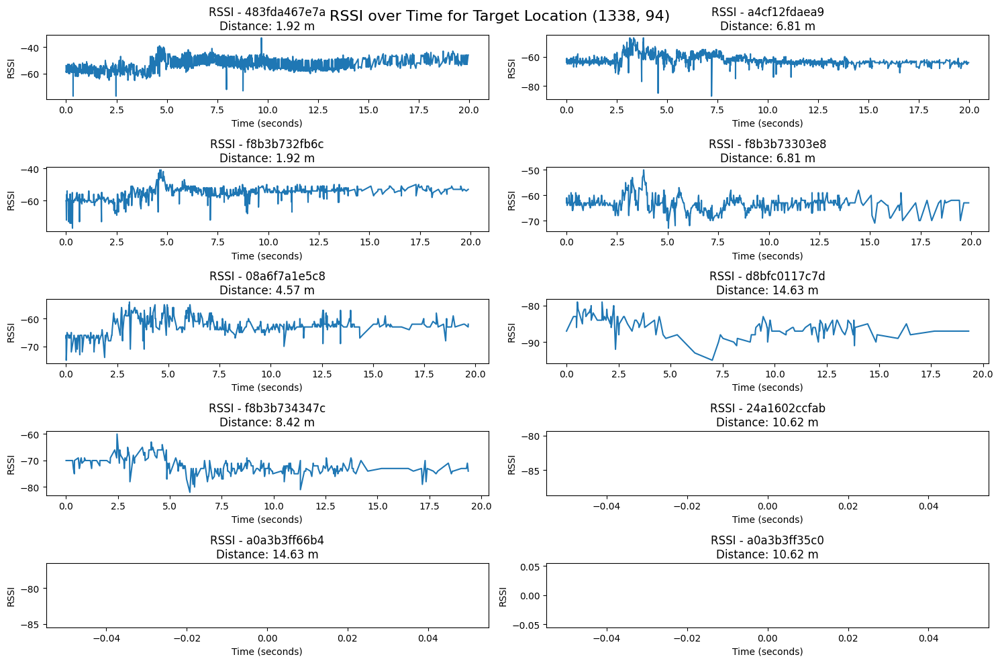

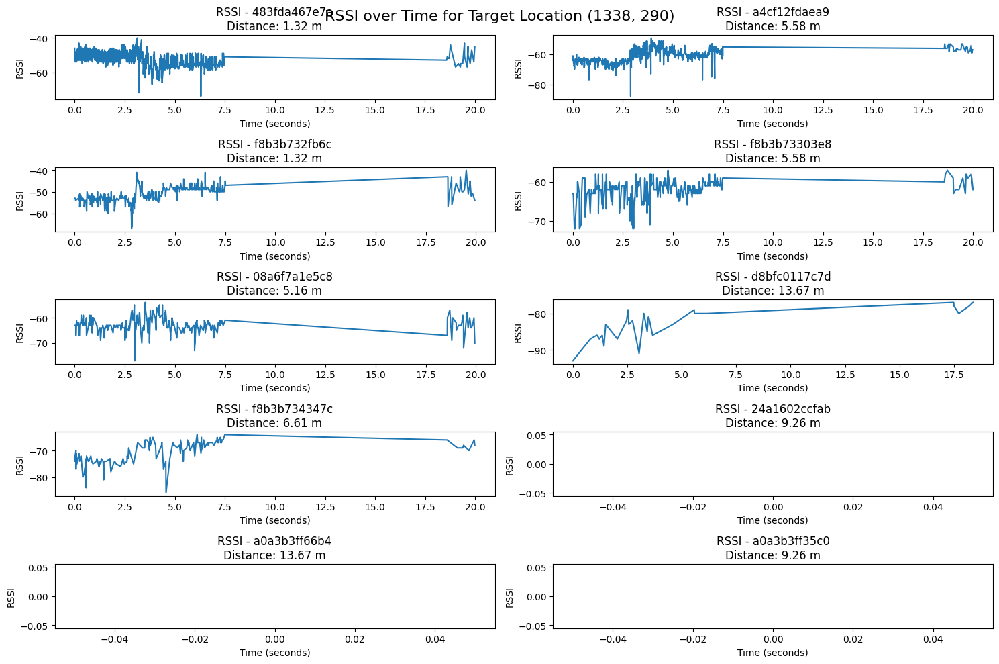

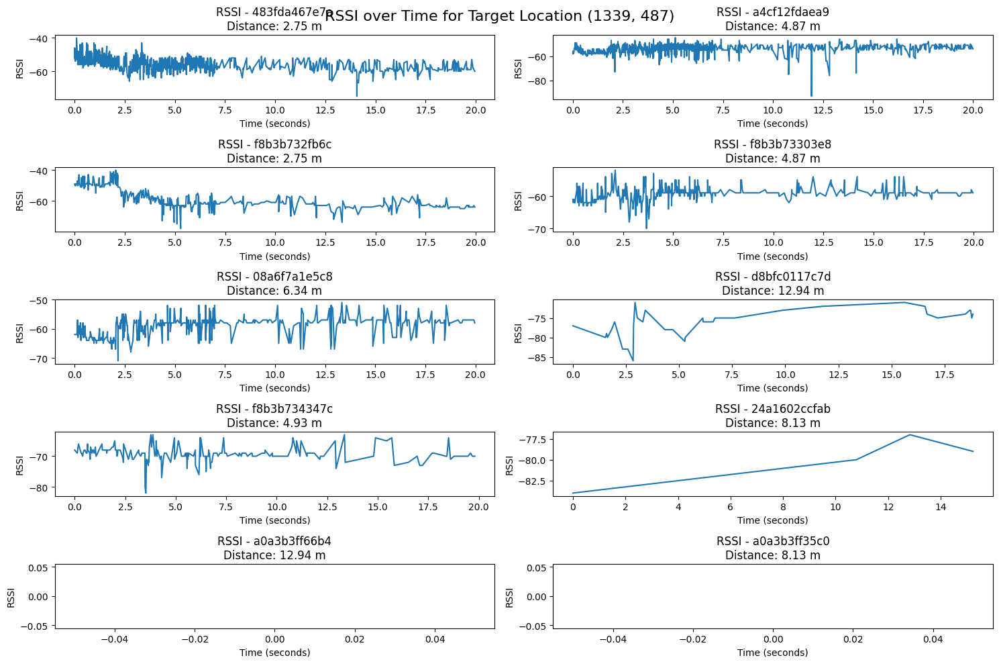

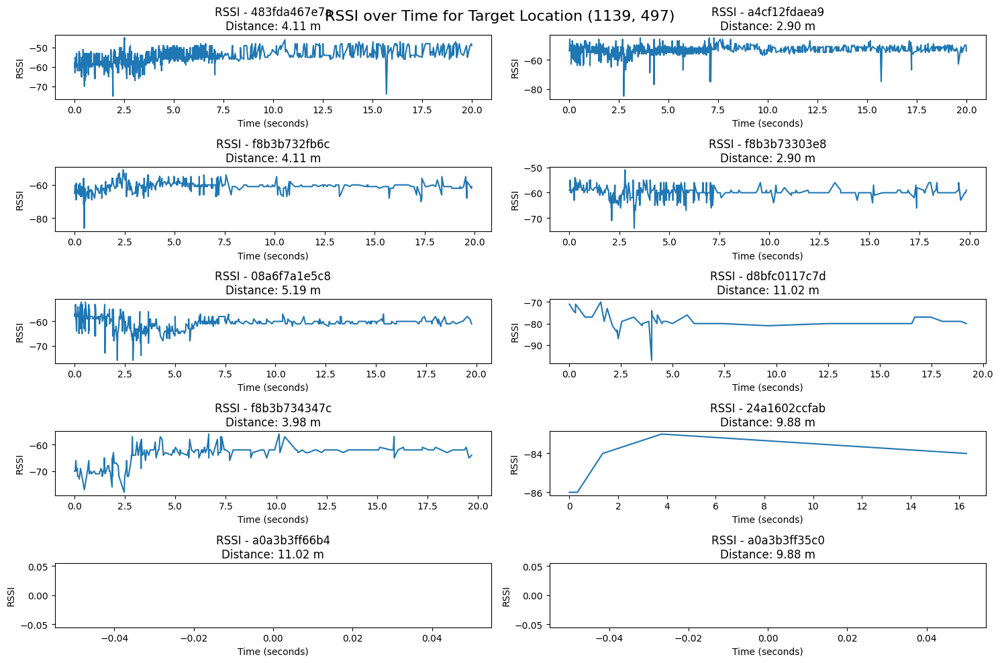

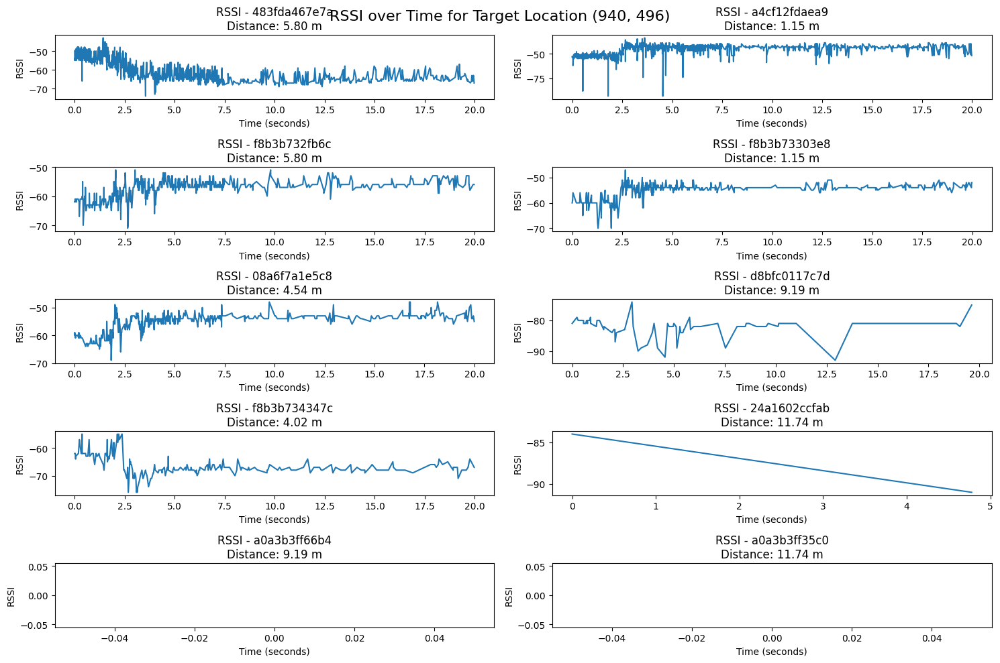

...

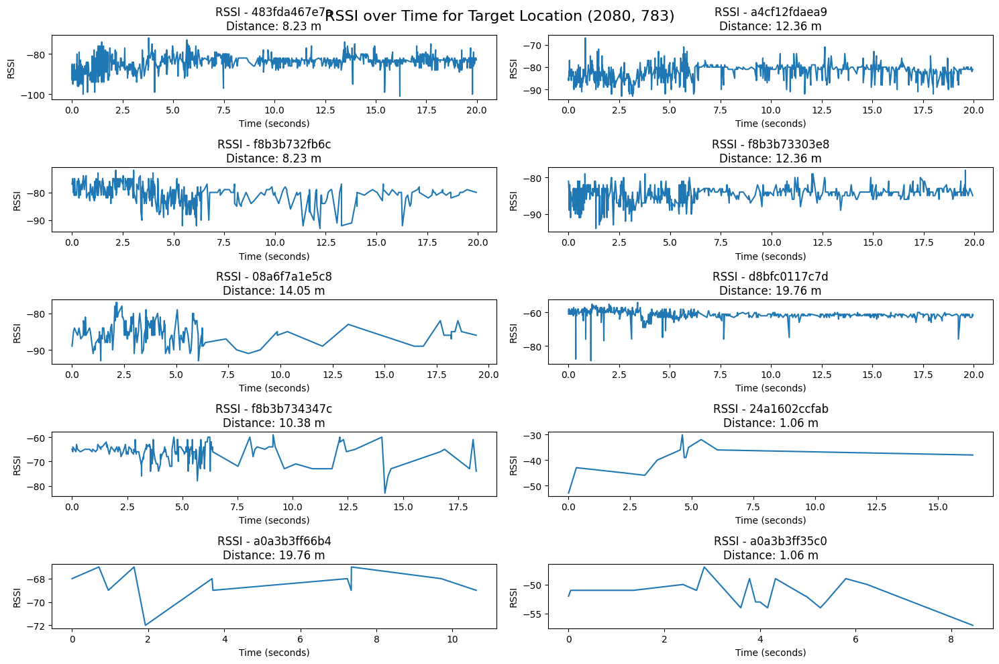

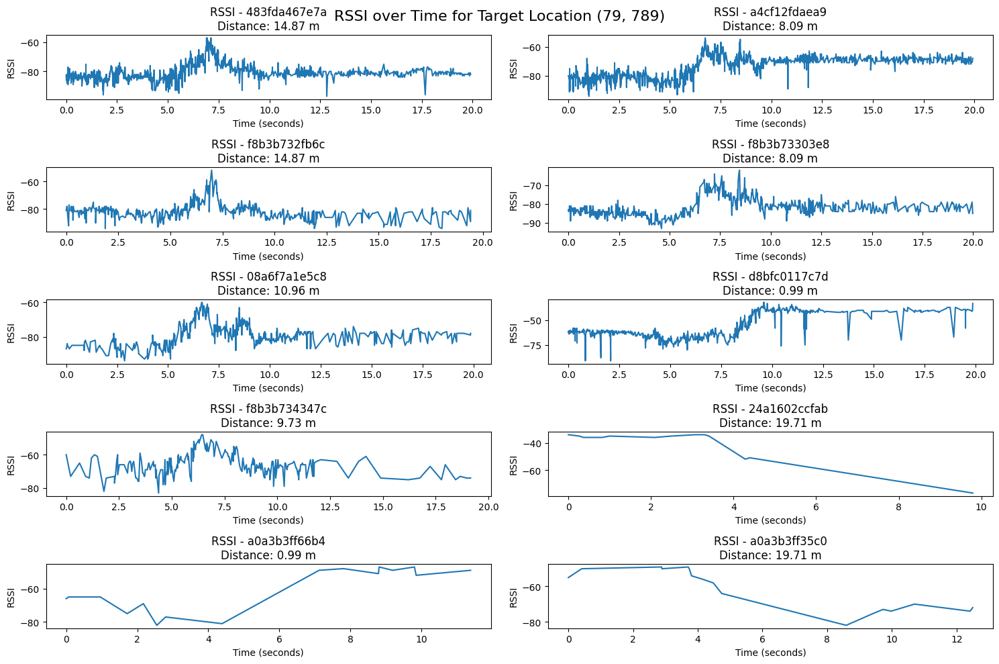

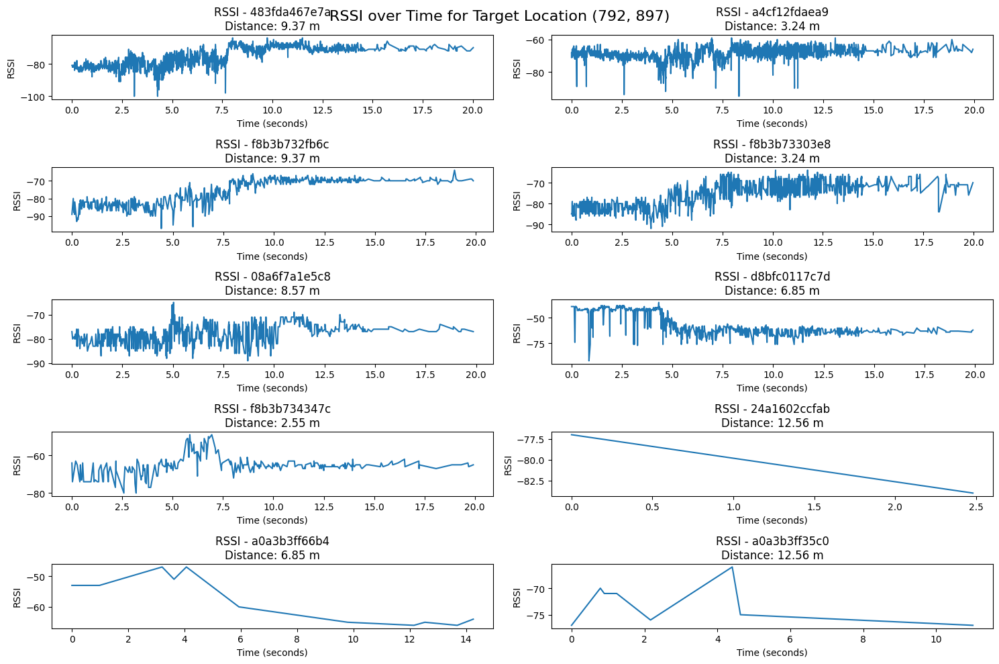

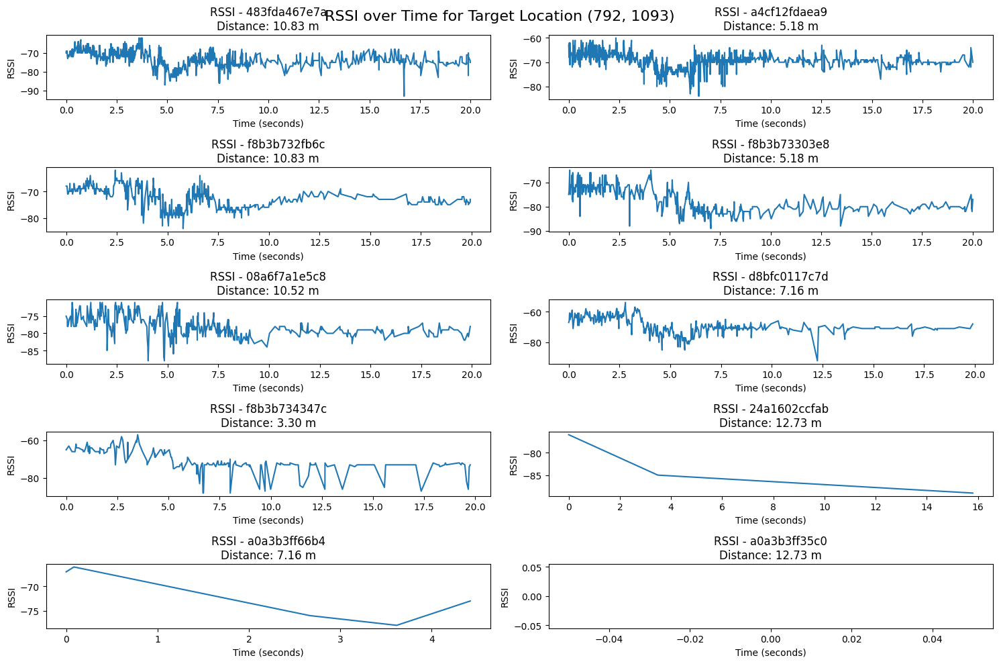

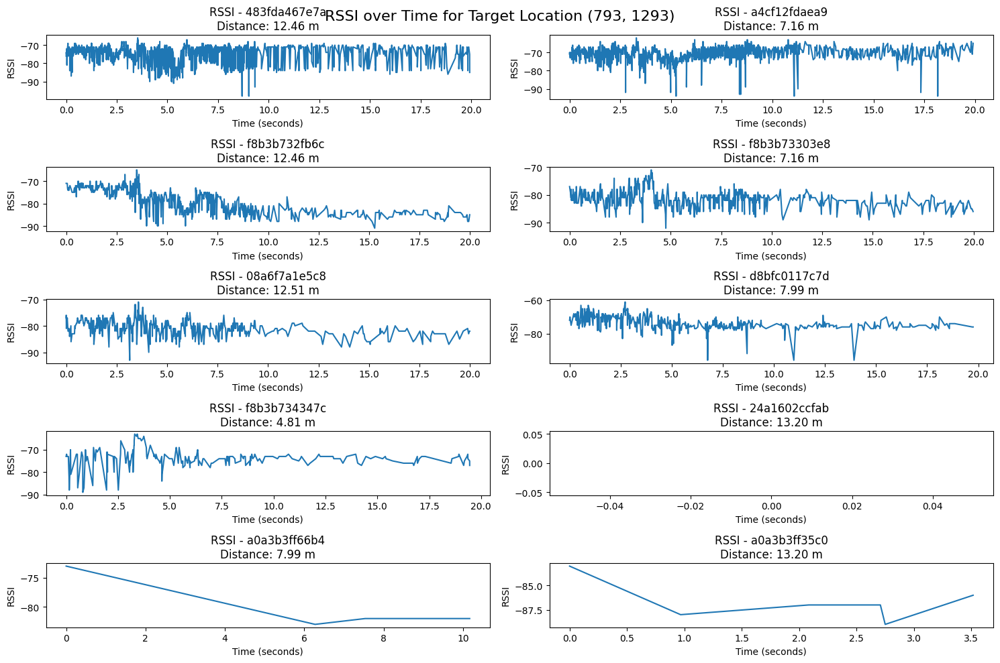

In [156]:
plot_rssi_over_time("./data/filtered/apb/Pixel9.csv")

## Error Metrics

### User Range Error

In [13]:
def prep_data(df):
    # Merge coordinates into single columns
    df["anchor_position"] = list(zip(df["anchor_position_x"], df["anchor_position_y"]))
    df["target_position"] = list(zip(df["target_position_x"], df["target_position_y"]))

    # Round the coordinates in the anchor_position and target_position columns
    df["anchor_position"] = df["anchor_position"].apply(lambda pos: (round(pos[0]), round(pos[1])))
    df["target_position"] = df["target_position"].apply(lambda pos: (round(pos[0]), round(pos[1])))

    # Drop the original coordinate columns if no longer needed
    df.drop(columns=["anchor_position_x", "anchor_position_y", "target_position_x", "target_position_y"], inplace=True)

    # Group by monitor_mac and target_position, and calculate the median RSSI
    df_median_rssi = (
        df.groupby(["target_position", "target_mac", "monitor_mac", "anchor_position"], as_index=False)
        .agg(rssi=('rssi', 'median'), group_size=('rssi', 'size'))
    )

    # choose a threshold of how many rssi readings are mandatory
    # first try it with at least 1 sample per second
    df_median_rssi_filtered = df_median_rssi[df_median_rssi["group_size"] >= 20]

    return df_median_rssi_filtered

In [14]:
# fingerprint data
df_fingerprint_pixel9 = prep_data(pd.read_csv("./data/filtered/apb/Pixel9.csv"))
df_fingerprint_p20 = prep_data(pd.read_csv("./data/filtered/apb/P20_Pro.csv"))
df_fingerprint_iphone = prep_data(pd.read_csv("./data/filtered/apb/iPhone.csv"))

df_fingerprint_median = pd.concat([df_fingerprint_pixel9, df_fingerprint_p20, df_fingerprint_iphone]).reset_index()

# eval data
df_eval_pixel9 = prep_data(pd.read_csv("./data/filtered/apb/Pixel9_eval.csv"))
df_eval_p20 = prep_data(pd.read_csv("./data/filtered/apb/P20_Pro_eval.csv"))
df_eval_iphone = prep_data(pd.read_csv("./data/filtered/apb/iPhone_eval.csv"))

df_eval_median = pd.concat([df_eval_pixel9, df_eval_p20, df_eval_iphone]).reset_index()
df_eval_median

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size
0,0,"(177, 786)",20f094118214,08a6f7a1e5c8,"(884, 45)",-55.0,85
1,1,"(177, 786)",20f094118214,24a1602ccfab,"(2048, 884)",-77.0,658
2,2,"(177, 786)",20f094118214,483fda467e7a,"(1461, 241)",-57.0,118
3,3,"(177, 786)",20f094118214,a0a3b3ff35c0,"(2048, 884)",-78.0,213
4,4,"(177, 786)",20f094118214,a0a3b3ff66b4,"(107, 884)",-54.0,1129
...,...,...,...,...,...,...,...
348,145,"(1987, 781)",d81c79de34e1,a0a3b3ff35c0,"(2048, 884)",-56.0,330
349,146,"(1987, 781)",d81c79de34e1,a0a3b3ff66b4,"(107, 884)",-72.0,80
350,147,"(1987, 781)",d81c79de34e1,a4cf12fdaea9,"(861, 580)",-86.0,83
351,148,"(1987, 781)",d81c79de34e1,d8bfc0117c7d,"(107, 884)",-74.0,194


In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

monitor_groups = [
    ["483fda467e7a", "f8b3b732fb6c"],
    ["d8bfc0117c7d", "a0a3b3ff66b4"],
    ["24a1602ccfab", "a0a3b3ff35c0"],
    ["a4cf12fdaea9", "f8b3b73303e8"],
    ["f8b3b734347c"],
    ["08a6f7a1e5c8"]
]

# right now only works for APB
def classify_target_location(coordinates):
    rect_x_min = 780
    rect_x_max = 1520
    rect_y_min = 0
    rect_y_max = 665

    if rect_x_min <= coordinates[0] <= rect_x_max and rect_y_min <= coordinates[1] <= rect_y_max:
        return "inside"
    else:
        return "outside"

def get_distance_and_classify(df):
    df_distances = df.copy()

    # Add the "class" column
    df_distances["class"] = df_distances["target_position"].apply(classify_target_location)

    # Add the "distance" column
    df_distances["distance"] = df_distances.apply(
        # Function to calculate the Euclidean distance# Function to calculate the Euclidean distance
        lambda row: np.linalg.norm(np.array(row["target_position"]) - np.array(row["anchor_position"])) / 100.0, axis=1
    )

    return df_distances

def fit_path_loss_model(df_distances):
    # Function to fit the data and return the parameters
    def fit_group(group):
        if group.shape[0] < 5:
            return pd.Series({"rssi_0": np.nan, "n": np.nan})
        
        distances = group["distance"].values
        rssis = group["rssi"].values

        # Fit the function to the data
        popt, _ = curve_fit(inverse_path_loss_model, rssis, distances, p0=(-50, 2))
        return pd.Series({"rssi_0": popt[0], "n": popt[1]})

    return df_distances[df_distances["distance"] > 0].groupby(["target_mac", "monitor_mac"]).apply(fit_group).reset_index()

def plot_rssi_vs_distance(df_distances, df_model_params, group=True):
    global target_macs

    grouping = monitor_groups if group else [[monitor_mac] for monitor_mac in df_distances["monitor_mac"].unique()]

    # Define marker shapes for the classes
    marker_styles = {"inside": "x", "outside": "o"}
    
    # Iterate over each group of monitor MACs
    for group_index, monitor_group in enumerate(grouping):
        # Create a figure with enough space for all subplots
        fig, axs = plt.subplots(1, len(df_distances["target_mac"].unique()), figsize=(18, 6), sharey=True)
        
        # Set the figure title for the current group
        fig.suptitle(f"RSSI vs. Distance for Group {group_index + 1}", fontsize=16)

        # Collect handles and labels for the legend
        all_handles, all_labels = [], []

        for target_idx, target_mac in enumerate(target_macs):
            df_target = df_distances[df_distances["target_mac"] == target_mac]
            df_target_params = df_model_params[df_model_params["target_mac"] == target_mac]

            ax = axs[target_idx]  # Get the subplot for this target_mac
        
            for monitor_idx, monitor_mac in enumerate(monitor_group):
                df_monitor = df_target[df_target["monitor_mac"] == monitor_mac]
                df_monitor_params = df_target_params[df_target_params["monitor_mac"] == monitor_mac]

                # Scatter plot with marker styles based on classes
                for target_class in df_monitor["class"].unique():
                    df_class = df_monitor[df_monitor["class"] == target_class]
                    scatter = ax.scatter(
                            df_class["distance"], 
                            df_class["rssi"], 
                            label=f'Monitor {monitor_mac} ({target_class})', 
                            marker=marker_styles[target_class],
                            color=plt.cm.tab10(monitor_idx),
                            alpha=0.7
                        )

                    # Collect handles and labels only if not already added
                    if f'Monitor {monitor_mac} ({target_class})' not in all_labels:
                        all_handles.append(scatter)
                        all_labels.append(f'Monitor {monitor_mac} ({target_class})')

                if len(df_monitor_params.index) > 0:
                    rssi_0 = df_monitor_params["rssi_0"].item()
                    n = df_monitor_params["n"].item()
                        
                    # Generate fit line
                    fit_distances = np.linspace(df_monitor["distance"].min(), df_monitor["distance"].max(), 500)
                    fit_rssis = path_loss_model(fit_distances, rssi_0, n)
                        
                    # Plot the fit
                    (line_handle, ) = ax.plot(fit_distances, fit_rssis, label=f'Fit {monitor_mac}', linestyle='--')

                    # Collect handles and labels only if not already added
                    if f'Fit {monitor_mac}' not in all_labels:
                        all_handles.append(line_handle)
                        all_labels.append(f'Fit {monitor_mac}')
        
            # Customize the plot
            ax.set_title(f"Target: {device_names[target_mac]}")
            ax.set_xlabel("Distance (m)")
            ax.set_ylabel("Median RSSI")
            ax.grid(True)
        
        # Add a shared legend above the subplots
        fig.legend(
            all_handles,
            all_labels,
            loc='upper right',  # Anchor the legend to its top-right corner
            ncol=1,             # Single column legend
            fontsize='small',
            bbox_to_anchor=(0.99, 0.88),  # Adjust these values for precise alignment
        )

        fig.tight_layout()
        plt.show()

Fingerprint:


C:\Users\nikok\AppData\Local\Temp\ipykernel_320404\1614221082.py:54: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df_distances[df_distances["distance"] > 0].groupby(["target_mac", "monitor_mac"]).apply(fit_group).reset_index()


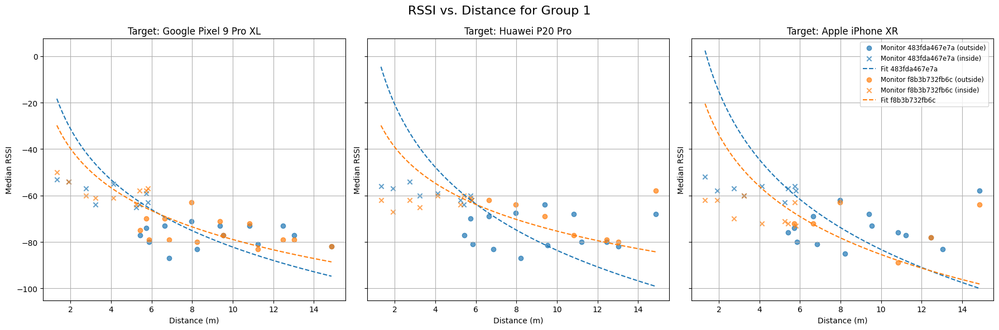

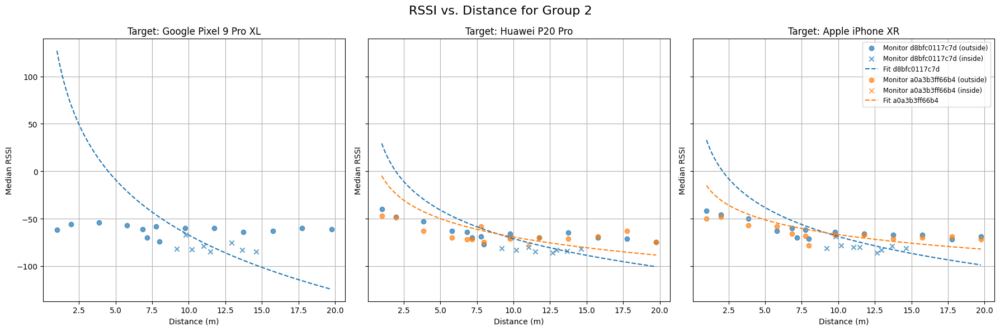

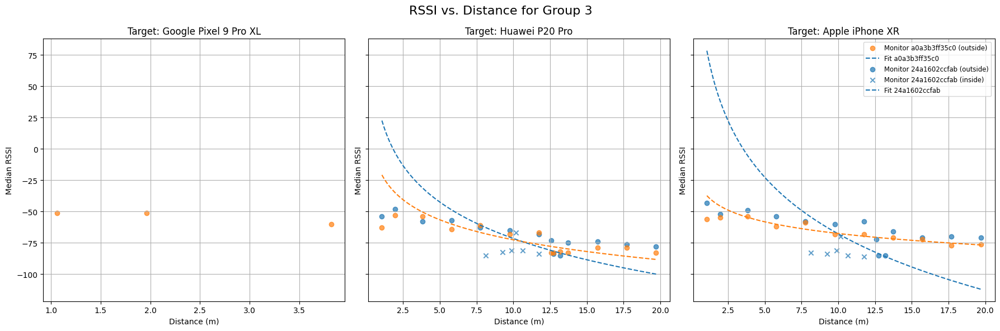

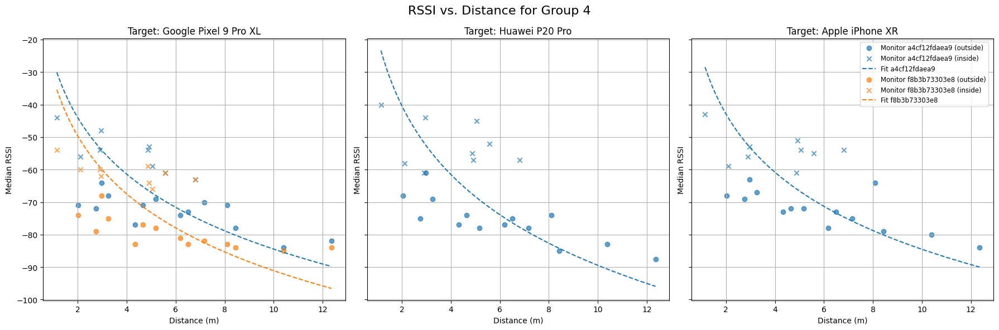

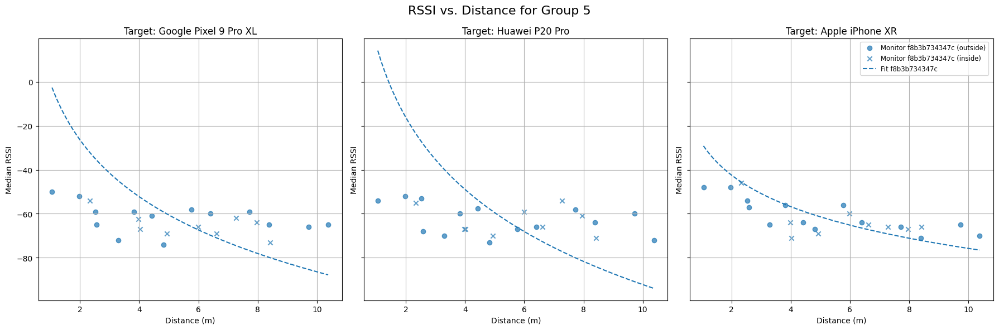

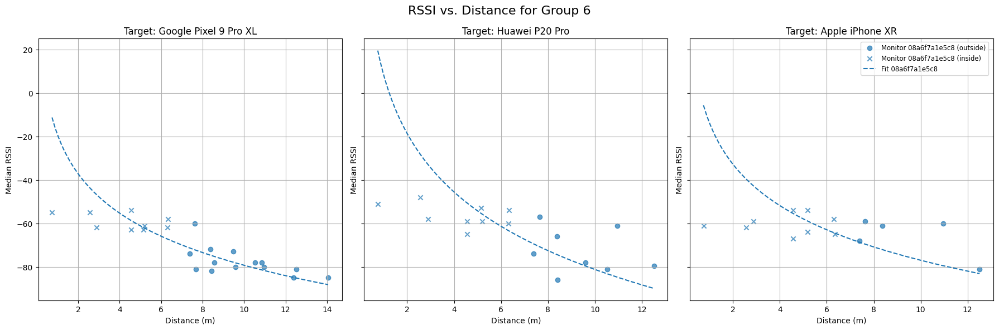

Eval:


C:\Users\nikok\AppData\Local\Temp\ipykernel_320404\1614221082.py:54: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df_distances[df_distances["distance"] > 0].groupby(["target_mac", "monitor_mac"]).apply(fit_group).reset_index()


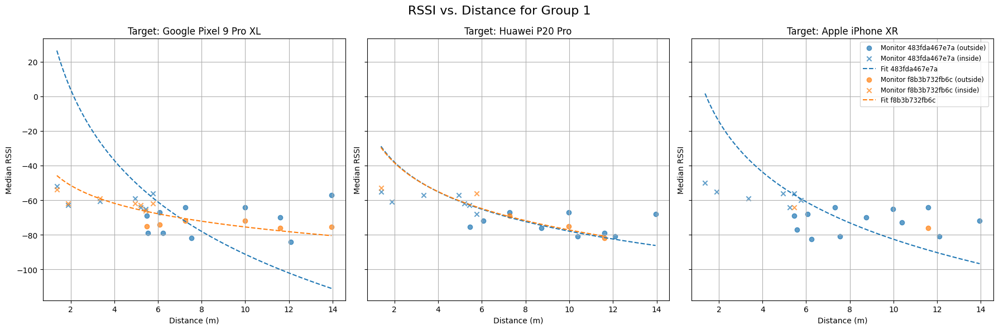

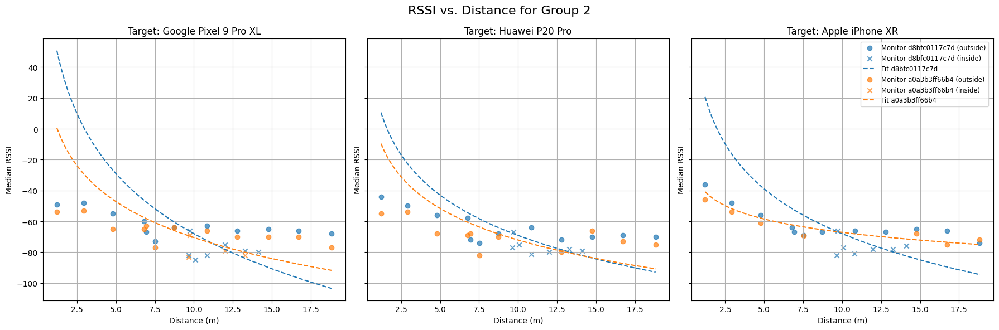

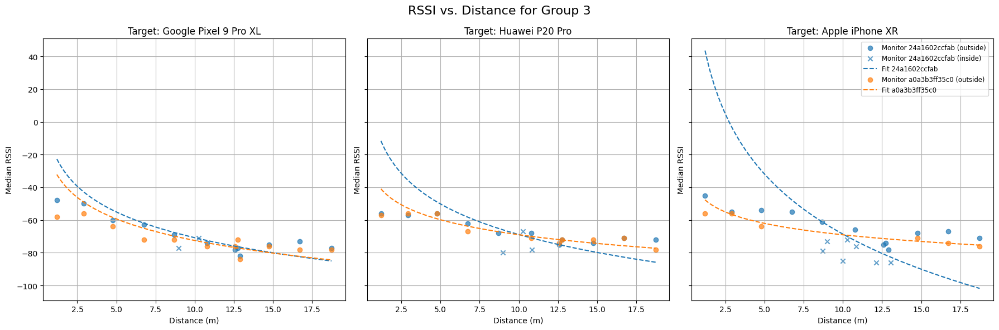

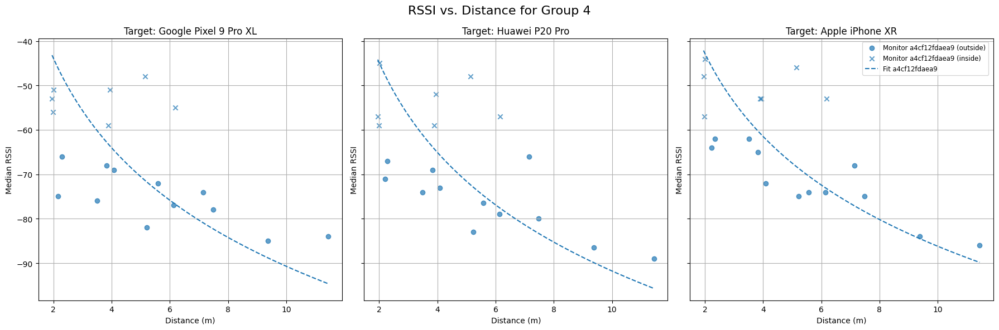

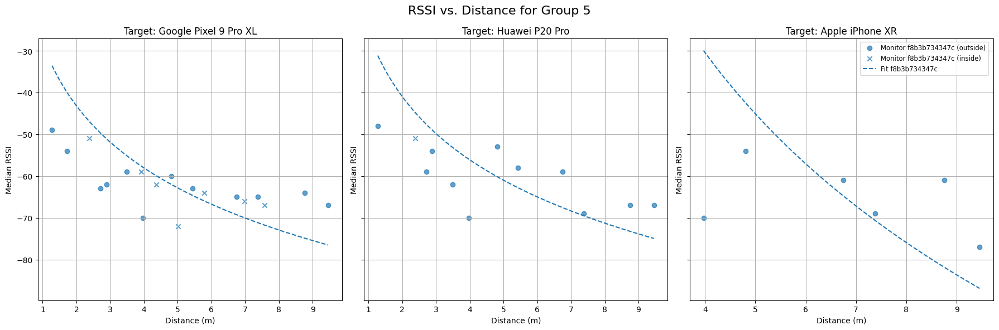

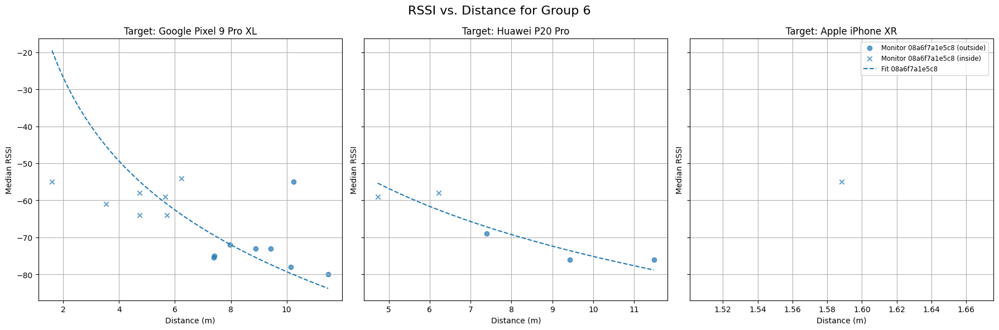

In [16]:
# fingerprint data
print("Fingerprint:")
df_fingerprint_distances = get_distance_and_classify(df_fingerprint_median)
df_fingerprint_model_params = fit_path_loss_model(df_fingerprint_distances)
plot_rssi_vs_distance(df_fingerprint_distances, df_fingerprint_model_params)

# eval data
print("Eval:")
df_eval_distances = get_distance_and_classify(df_eval_median)
df_eval_model_params = fit_path_loss_model(df_eval_distances)
plot_rssi_vs_distance(df_eval_distances, df_eval_model_params)

In [17]:
df_eval_distances

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance
0,0,"(177, 786)",20f094118214,08a6f7a1e5c8,"(884, 45)",-55.0,85,outside,10.241728
1,1,"(177, 786)",20f094118214,24a1602ccfab,"(2048, 884)",-77.0,658,outside,18.735648
2,2,"(177, 786)",20f094118214,483fda467e7a,"(1461, 241)",-57.0,118,outside,13.948767
3,3,"(177, 786)",20f094118214,a0a3b3ff35c0,"(2048, 884)",-78.0,213,outside,18.735648
4,4,"(177, 786)",20f094118214,a0a3b3ff66b4,"(107, 884)",-54.0,1129,outside,1.204326
...,...,...,...,...,...,...,...,...,...
348,145,"(1987, 781)",d81c79de34e1,a0a3b3ff35c0,"(2048, 884)",-56.0,330,outside,1.197080
349,146,"(1987, 781)",d81c79de34e1,a0a3b3ff66b4,"(107, 884)",-72.0,80,outside,18.828194
350,147,"(1987, 781)",d81c79de34e1,a4cf12fdaea9,"(861, 580)",-86.0,83,outside,11.437994
351,148,"(1987, 781)",d81c79de34e1,d8bfc0117c7d,"(107, 884)",-74.0,194,outside,18.828194


In [18]:
def get_user_range_error(df_distance, df_model_params):
    df_combined = pd.merge(df_distance, df_model_params, left_on=["target_mac", "monitor_mac"], right_on=["target_mac", "monitor_mac"], how="left")

    df_combined["estimated_distance"] = df_combined.apply(lambda row: inverse_path_loss_model(row["rssi"], row["rssi_0"], row["n"]), axis=1)
    df_combined["ure"] = df_combined.apply(lambda row: abs(row["distance"] - row["estimated_distance"]), axis=1)

    return df_combined

def plot_ure(dfs_ure, df_labels):
    global target_macs

    # Create a figure with enough space for all subplots
    fig1, axs1 = plt.subplots(1, len(target_macs), figsize=(18, 6), sharey=True)
    fig2, axs2 = plt.subplots(1, len(target_macs), figsize=(18, 6), sharey=True)
    
    # Set the figure title for the current group
    # fig.suptitle(f"RSSI vs. Distance for Group {group_index + 1}", fontsize=16)

    for target_idx, target_mac in enumerate(target_macs):
        df_targets = [df[df["target_mac"] == target_mac] for df in dfs_ure]
        ures = [df_target["ure"].to_numpy() for df_target in df_targets]

        ax1 = axs1[target_idx]  # Get the subplot for this target_mac

        # Plot the boxplots for URE
        ax1.boxplot(ures, 
                    tick_labels=df_labels, 
                    showfliers=False)  # Disable rendering of outliers
        ax1.set_title(f"User Range Error (URE) for {device_names[target_mac]}")
        ax1.set_ylabel("User Range Error (m)")
        ax1.grid(True)
    
        # Sort the URE values for cumulative plotting
        ures_sorted = [np.sort(ure) for ure in ures]
        
        # Calculate the cumulative distribution
        cdfs = [np.arange(1, len(ure_sorted) + 1) / len(ure_sorted) for ure_sorted in ures_sorted]
        
        ax2 = axs2[target_idx]  # Get the subplot for this target_mac

        # Plot the CDF for all monitors and the two groups
        for cdf_idx, cdf in enumerate(cdfs):
            ax2.plot(ures_sorted[cdf_idx], cdf, label=df_labels[cdf_idx], color=plt.cm.tab10(cdf_idx))

        percentiles = [50, 95]

        # Add percentile markers with striped lines
        for p in percentiles:
            ure_percentiles = [np.percentile(ure, p) for ure in ures]
            max_percentile = max(ure_percentiles)

            # Draw dashed lines for "All Monitors"
            ax2.axhline(y=p / 100.0, xmin=0, xmax=max_percentile / ax2.get_xlim()[1], 
                           color='black', linestyle='dashed', linewidth=0.8, alpha=0.7)

            for ure_percentile_idx, ure_percentile in enumerate(ure_percentiles):
                ax2.axvline(x=ure_percentile, ymin=0, ymax=p / 100.0 / ax2.get_ylim()[1], color=plt.cm.tab10(ure_percentile_idx), linestyle='dashed', linewidth=0.8, alpha=0.7)
                #ax2.scatter(ure_percentile, p / 100.0, color=plt.cm.tab10(ure_percentile_idx), marker='o')

        # Add legend
        ax2.legend(
            loc='lower right'
        )

        # Limit the x-axis to 100 meters
        # plt.xlim(0, 100)

        ax2.set_title(f"Cumulative Distribution of URE for {device_names[target_mac]}")
        ax2.set_xlabel("User Range Error (m)")
        ax2.set_ylabel("Cumulative Probability")
        ax2.grid(True)


    fig1.tight_layout()
    fig2.tight_layout()
    plt.show()

def rmse(series):
    return np.sqrt((series**2).mean())

def print_ure_statistics(dfs_ure, df_labels):
    global target_macs
    
    for target_mac in target_macs:
        print(f"For {device_names[target_mac]}:")

        ure_groups = []
        ure_means = []
        ure_medians = []
        ure_rmses = []

        for df, df_label in zip(dfs_ure, df_labels):
            df_target = df[df["target_mac"] == target_mac]

            ure_groups.append(df_label)
            ure_means.append(df_target["ure"].mean())
            ure_medians.append(df_target["ure"].median())
            ure_rmses.append(rmse(df_target["ure"]))

        print(pd.DataFrame({
            'Group': ure_groups,
            'Mean': ure_means,
            'Median': ure_medians,
            'RMSE': ure_rmses
        }))

        print()

Fingerprint:


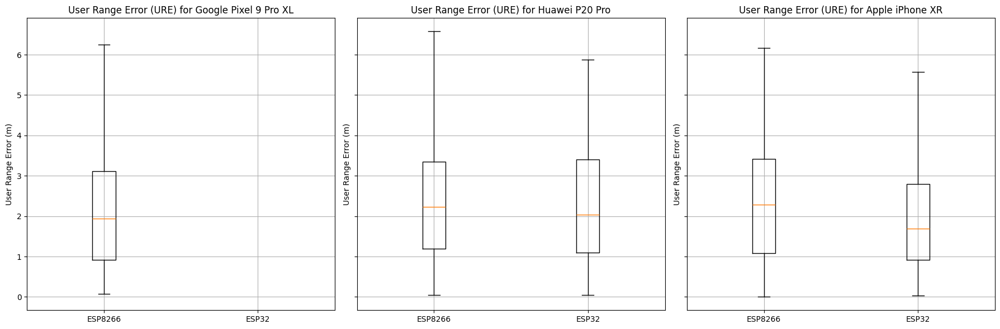

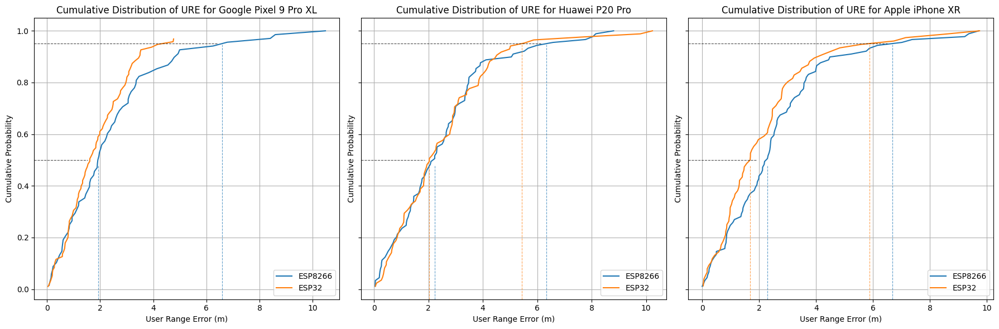

Eval:


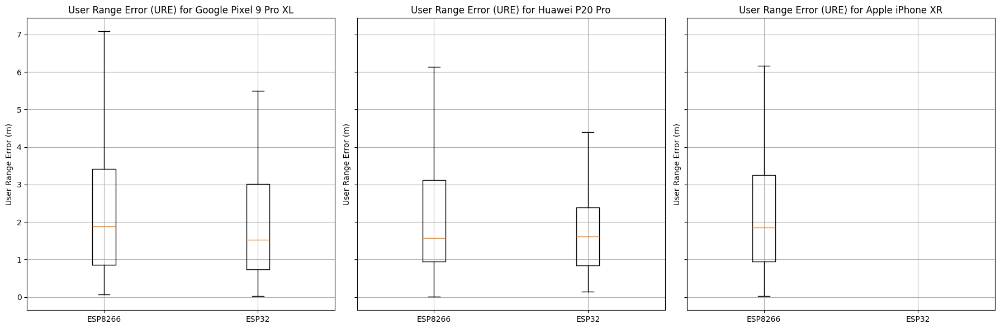

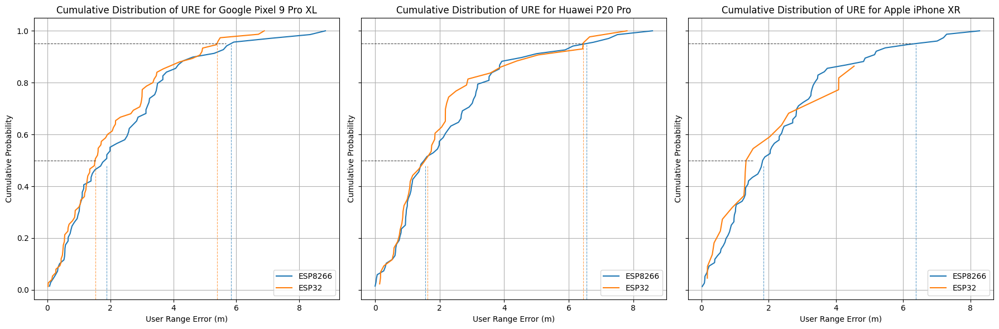

For Google Pixel 9 Pro XL:
     Group      Mean    Median      RMSE
0  ESP8266  2.348611  1.887200  3.042343
1    ESP32  2.054987  1.527485  2.634972

For Huawei P20 Pro:
     Group      Mean    Median      RMSE
0  ESP8266  2.236230  1.564021  2.945222
1    ESP32  2.109307  1.617473  2.825205

For Apple iPhone XR:
     Group      Mean    Median      RMSE
0  ESP8266  2.314579  1.852517  2.974569
1    ESP32  1.732006  1.301608  2.206685

Different:


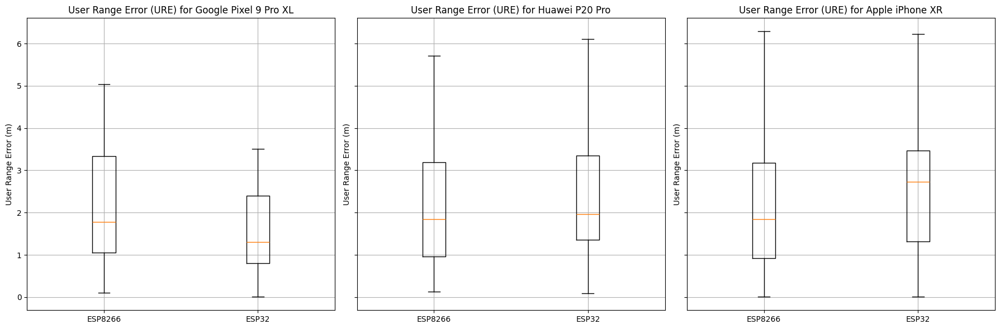

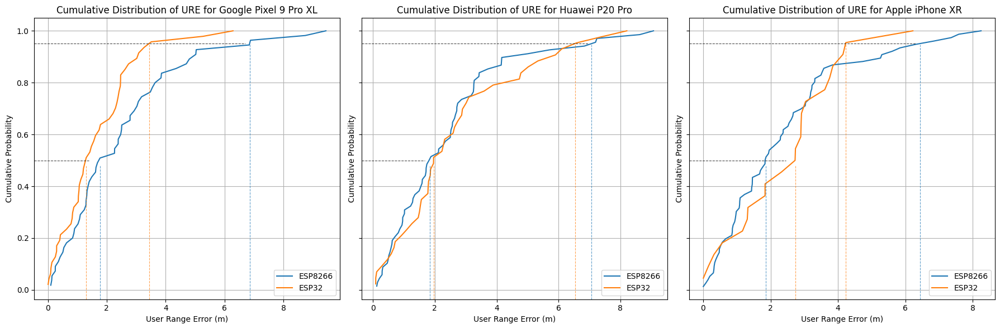

For Google Pixel 9 Pro XL:
     Group      Mean    Median      RMSE
0  ESP8266  2.463983  1.773696  3.215794
1    ESP32  1.637113  1.305410  2.086144

For Huawei P20 Pro:
     Group      Mean    Median      RMSE
0  ESP8266  2.372178  1.844769  3.086085
1    ESP32  2.641487  1.961808  3.323455

For Apple iPhone XR:
     Group      Mean    Median      RMSE
0  ESP8266  2.310982  1.850857  2.988965
1    ESP32  2.448915  2.732943  2.881313



In [20]:
df_labels = ["ESP8266", "ESP32"] #, "All Monitors"]

# fingerprint data
print("Fingerprint:")
df_fingerprint_ure_all = get_user_range_error(df_fingerprint_distances, df_fingerprint_model_params)
df_fingerprint_ure_esp8266 = filter_esp8266(df_fingerprint_ure_all)
df_fingerprint_ure_esp32 = filter_esp32(df_fingerprint_ure_all)
dfs_fingerprint_ure = [df_fingerprint_ure_esp8266, df_fingerprint_ure_esp32] #, df_fingerprint_ure_all]

plot_ure(dfs_fingerprint_ure, df_labels)

# eval data
print("Eval:")
df_eval_ure_all = get_user_range_error(df_eval_distances, df_eval_model_params)
df_eval_ure_esp8266 = filter_esp8266(df_eval_ure_all)
df_eval_ure_esp32 = filter_esp32(df_eval_ure_all)
dfs_eval_ure = [df_eval_ure_esp8266, df_eval_ure_esp32] #, df_eval_ure_all]

plot_ure(dfs_eval_ure, df_labels)
print_ure_statistics(dfs_eval_ure, df_labels)

# different data for the model params
print("Different:")
df_different_ure_all = get_user_range_error(df_eval_distances, df_fingerprint_model_params)
df_different_ure_esp8266 = filter_esp8266(df_different_ure_all)
df_different_ure_esp32 = filter_esp32(df_different_ure_all)
dfs_different_ure = [df_different_ure_esp8266.dropna(subset=['ure']), df_different_ure_esp32.dropna(subset=['ure'])] #, df_different_ure_all]

plot_ure(dfs_different_ure, df_labels)
print_ure_statistics(dfs_different_ure, df_labels)

In [21]:
df_fingerprint_model_params.to_csv("./data/filtered/apb/fingerprint_model_params.csv", index=False)

- Pixel 9 has weird fingerprint data
- P20 & iPhone are good though:
  - About same URE on same data & on fingerprint data
  - iPhone overall the best

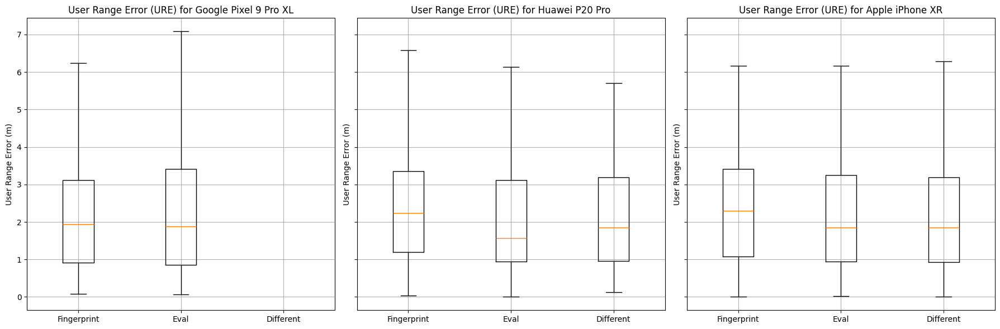

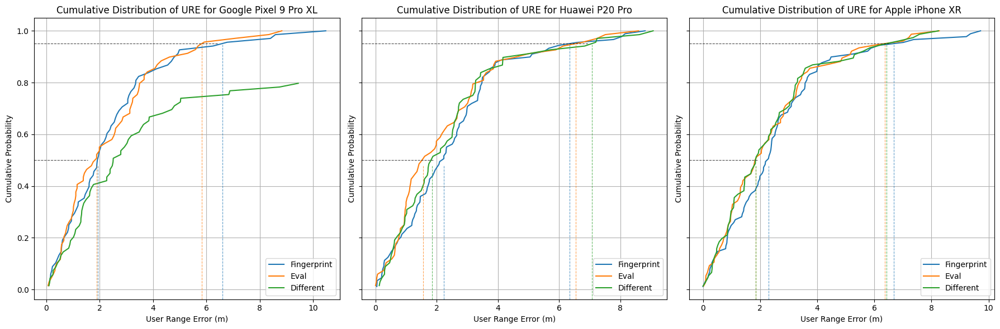

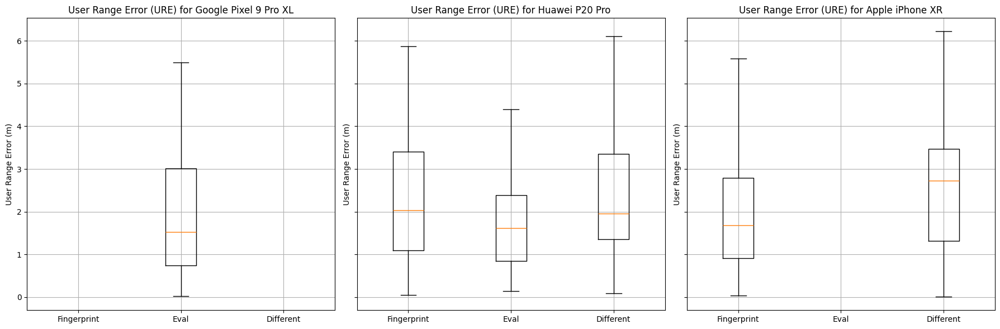

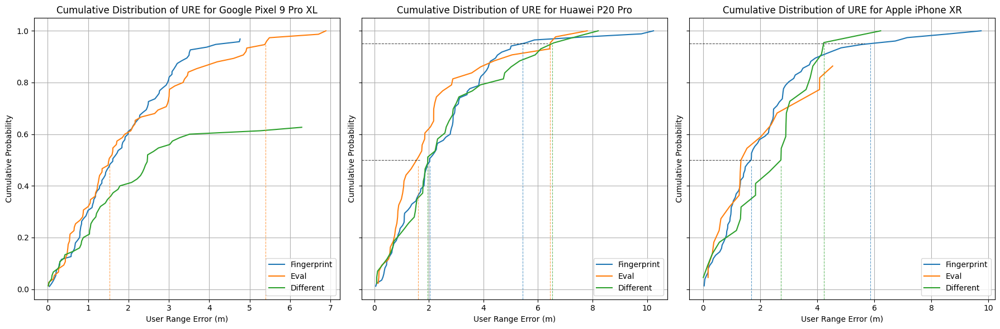

In [22]:
plot_ure([df_fingerprint_ure_esp8266, df_eval_ure_esp8266, df_different_ure_esp8266], ["Fingerprint", "Eval", "Different"])
plot_ure([df_fingerprint_ure_esp32, df_eval_ure_esp32, df_different_ure_esp32], ["Fingerprint", "Eval", "Different"])

In [23]:
df_different_ure_esp32.sort_values("ure")

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance,rssi_0,n,estimated_distance,ure
257,3,"(177, 786)",d81c79de34e1,a0a3b3ff35c0,"(2048, 884)",-76.0,189,outside,18.735648,-36.580413,3.097733,18.729673,0.005974
58,68,"(943, 194)",20f094118214,f8b3b732fb6c,"(1461, 241)",-63.0,446,inside,5.201279,-22.954730,5.599785,5.189453,0.011826
73,85,"(1036, 493)",20f094118214,f8b3b732fb6c,"(1461, 241)",-62.0,445,inside,4.940941,-22.954730,5.599785,4.980395,0.039454
238,132,"(1581, 783)",342eb61ec446,a0a3b3ff35c0,"(2048, 884)",-56.0,707,outside,4.777970,-19.480194,5.313050,4.868112,0.090141
194,67,"(974, 779)",342eb61ec446,08a6f7a1e5c8,"(884, 45)",-69.0,68,outside,7.394971,8.301943,8.951812,7.303550,0.091421
...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,143,"(1581, 783)",20f094118214,a0a3b3ff66b4,"(107, 884)",-70.0,280,outside,14.774563,NaN,NaN,NaN,NaN
132,151,"(1777, 779)",20f094118214,a0a3b3ff35c0,"(2048, 884)",-56.0,858,outside,2.906303,NaN,NaN,NaN,NaN
133,152,"(1777, 779)",20f094118214,a0a3b3ff66b4,"(107, 884)",-70.0,381,outside,16.732976,NaN,NaN,NaN,NaN
139,160,"(1987, 781)",20f094118214,a0a3b3ff35c0,"(2048, 884)",-58.0,569,outside,1.197080,NaN,NaN,NaN,NaN


### Accuracy

In [24]:
from scipy.optimize import least_squares

class AbstractLocalization(ABC):

    def __init__(self):
        pass

    @abstractmethod
    def localize(self, rssis):
        pass
    
    def get_relevant_anchor_stats(self, anchor_stats, rssis):
        monitor_macs_intersec = anchor_stats.keys() & rssis.keys()
        anchor_stats_intersec = [anchor_stats[monitor_mac] for monitor_mac in monitor_macs_intersec]
        rssis_intersec = [rssis[monitor_mac] for monitor_mac in monitor_macs_intersec]
        
        return monitor_macs_intersec, anchor_stats_intersec, rssis_intersec
    
    def get_relevant_anchor_stats_all(self, anchor_stats, rssis, model_params):
        monitor_macs_intersec = anchor_stats.keys() & rssis.keys() & model_params.keys()
        anchor_stats_intersec = [anchor_stats[monitor_mac] for monitor_mac in monitor_macs_intersec]
        rssis_intersec = [rssis[monitor_mac] for monitor_mac in monitor_macs_intersec]
        model_params_intersec = [model_params[monitor_mac] for monitor_mac in monitor_macs_intersec]
        
        return monitor_macs_intersec, anchor_stats_intersec, rssis_intersec, model_params_intersec

class TrilaterationLeastSquaresLocalization(AbstractLocalization):
    def __init__(self, anchor_positions, monitor_model_params):
        super().__init__()
        
        self.anchor_positions = anchor_positions
        self.monitor_model_params = monitor_model_params
    
    def localize(self, rssis):
        relevant_monitor_macs, relevant_positions, relevant_rssis, relevant_model_params = self.get_relevant_anchor_stats_all(self.anchor_positions, rssis, self.monitor_model_params)
        relevant_distances = [inverse_path_loss_model(rssi, model_params[0], model_params[1]) * 100.0 for rssi, model_params in zip(relevant_rssis, relevant_model_params)] # m to cm

        relevant_rssis = np.array(relevant_rssis)
        relevant_positions = np.array(relevant_positions)
        relevant_distances = np.array(relevant_distances)
        print(relevant_positions)

        # relevant_positions = relevant_positions / 100.0
        # relevant_distances = relevant_distances / 100.0

        valid_rows = ~np.isnan(relevant_distances)
        relevant_rssis = relevant_rssis[valid_rows]
        relevant_positions = relevant_positions[valid_rows]
        relevant_distances = relevant_distances[valid_rows]

        print("rssis:")
        print(relevant_rssis)
        print("positions:")
        print(relevant_positions)
        print("distances:")
        print(relevant_distances)
        
        # Number of known positions
        n = len(relevant_positions)

        if n < 2:
            return {
                'position': None,
                'distances': {monitor_mac: distance for monitor_mac, distance in zip(relevant_monitor_macs, relevant_distances)}
            }
        
        '''
        # Build the A matrix and b vector
        A = []
        b = []
        
        x_n, y_n = relevant_positions[n-1]
        d_n = relevant_distances[n-1]
        for i in range(n - 1):
            x_i, y_i = relevant_positions[i]
            d_i = relevant_distances[i]
            A.append([2*(x_i - x_n), 2*(y_i - y_n)])
            b.append(x_i**2 + y_i**2 - x_n**2 - y_n**2 - d_i**2 + d_n**2)
        A = np.array(A)
        b = np.array(b)

        print("A:")
        print(A)
        print("b:")
        print(b)

        # Debug: Check condition number
        condition_number = np.linalg.cond(A.T @ A)
        print(f"Condition Number: {condition_number}")

        # Compute the least squares solution using the normal equation: x = (A^T A)^(-1) A^T b
        position, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
        '''

        # Initial guess for the target position: mean of anchor positions
        initial_guess = np.mean(relevant_positions, axis=0)

        def residuals(target):
            x, y = target
            return [np.sqrt((x - px)**2 + (y - py)**2) - d for (px, py), d in zip(relevant_positions, relevant_distances)]

        # Use least_squares for optimization
        result = least_squares(
            residuals,
            initial_guess,
            method='lm',
            ftol=1e-9,
            xtol=1e-9,
            max_nfev=5000
        )
        position = result.x if result.success else None

        print("Lstsq data:")
        print(position)
        # print(residuals)
        # print(rank)
        # print(s)

        # position *= 100.0
        
        return {
            'position': position,
            'distances': {monitor_mac: distance for monitor_mac, distance in zip(relevant_monitor_macs, relevant_distances)}
        }

class TrilaterationWeightedCentroidLocalization(AbstractLocalization):
    def __init__(self, anchor_positions, monitor_model_params, weight_func):
        super().__init__()
        
        self.anchor_positions = anchor_positions
        self.monitor_model_params = monitor_model_params
        self.weight_func = weight_func
    
    def localize(self, rssis):
        relevant_monitor_macs, relevant_positions, relevant_rssis = self.get_relevant_anchor_stats(self.anchor_positions, rssis)        
        relevant_positions_np = np.array(relevant_positions)

        # Calculate the weights using the custom function
        weights = np.array([self.weight_func(rssi, self.monitor_model_params[monitor_mac][0], self.monitor_model_params[monitor_mac][1]) for rssi, monitor_mac in zip(relevant_rssis, relevant_monitor_macs)])
        weight_sum = np.sum(weights)

        # Normalize the weights so they sum up to 1
        normalized_weights = weights / weight_sum
        
        # Weighted sum of positions
        x = np.sum([w * pos[0] for w, pos in zip(normalized_weights, relevant_positions_np)])
        y = np.sum([w * pos[1] for w, pos in zip(normalized_weights, relevant_positions_np)])
        
        position = (x, y)
        
        return {
            'position': position
        }

class FingerprintingLocalization(AbstractLocalization):
    def __init__(self, df_fingerprints, background_size, heatmap_resolution=5.0): # every 5cm
        super().__init__()
        
        x = np.arange(0, background_size[0], heatmap_resolution)
        y = np.arange(0, background_size[1], heatmap_resolution)
        self.pos_lookup_x = np.append(x, background_size[0]) # include boundary
        self.pos_lookup_y = np.append(y, background_size[1])
        num_x = len(self.pos_lookup_x)
        num_y = len(self.pos_lookup_y)
            
        gx, gy = np.meshgrid(self.pos_lookup_x, self.pos_lookup_y)
        gx, gy = gx.flatten(), gy.flatten()
        
        def generate_interpolated_fingerprint_map(monitor_mac):
            monitor_rows = df_fingerprints[df_fingerprints['monitor_mac'] == monitor_mac]
            
            target_positions = monitor_rows['target_position'].to_list()
            (target_positions_x, target_positions_y) = zip(*target_positions)
            rssi_medians = monitor_rows['rssi'].to_list()
            
            
            # from https://github.com/jantman/python-wifi-survey-heatmap/blob/master/wifi_survey_heatmap/heatmap.py
            
            rbf = Rbf(target_positions_x, target_positions_y, rssi_medians, function='linear')
            z = rbf(gx, gy)
            z = z.reshape((num_y, num_x))
            
            return z
        
        monitor_macs = df_fingerprints['monitor_mac'].unique()
        self.interpolated_fingerprints = {monitor_mac: generate_interpolated_fingerprint_map(monitor_mac) for monitor_mac in monitor_macs}
    
    def localize(self, rssis):
        _, relevant_interpolated_fingerprints, relevant_rssis = self.get_relevant_anchor_stats(self.interpolated_fingerprints, rssis)
        
        diff = np.moveaxis(relevant_interpolated_fingerprints, 0, -1) - relevant_rssis        
        norm = np.linalg.norm(diff, axis=2)
        min_pos_heatmap = np.unravel_index(np.argmin(norm, axis=None), norm.shape)        
        min_pos = (self.pos_lookup_x[min_pos_heatmap[1]], self.pos_lookup_y[min_pos_heatmap[0]])
        
        position = min_pos
        
        return {
            'position': position,
            'heatmap': norm
        }

In [25]:
def combine_df_model_params(df, df_model_params):
    return pd.merge(df, df_model_params, left_on=["target_mac", "monitor_mac"], right_on=["target_mac", "monitor_mac"], how="left")

df_fingerprint_combined = combine_df_model_params(df_fingerprint_distances, df_fingerprint_model_params)
df_eval_combined = combine_df_model_params(df_eval_distances, df_eval_model_params)
df_different_combined = combine_df_model_params(df_eval_distances, df_fingerprint_model_params)

df_fingerprint_combined

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance,rssi_0,n
0,0,"(79, 789)",20f094118214,08a6f7a1e5c8,"(884, 45)",-80.0,530,outside,10.961574,-19.045209,6.024432
1,2,"(79, 789)",20f094118214,483fda467e7a,"(1461, 241)",-82.0,1406,outside,14.866836,-9.414801,7.280350
2,5,"(79, 789)",20f094118214,a4cf12fdaea9,"(861, 580)",-71.0,1651,outside,8.094473,-26.522392,5.794322
3,6,"(79, 789)",20f094118214,d8bfc0117c7d,"(107, 884)",-62.0,898,outside,0.990404,126.231499,19.349939
4,7,"(79, 789)",20f094118214,f8b3b732fb6c,"(1461, 241)",-82.0,589,outside,14.866836,-22.954730,5.599785
...,...,...,...,...,...,...,...,...,...,...,...
497,198,"(2080, 783)",d81c79de34e1,a0a3b3ff35c0,"(2048, 884)",-56.0,458,outside,1.059481,-36.580413,3.097733
498,199,"(2080, 783)",d81c79de34e1,a0a3b3ff66b4,"(107, 884)",-72.0,232,outside,19.755835,-15.306922,5.151329
499,200,"(2080, 783)",d81c79de34e1,a4cf12fdaea9,"(861, 580)",-84.0,262,outside,12.357872,-24.981030,5.954256
500,201,"(2080, 783)",d81c79de34e1,d8bfc0117c7d,"(107, 884)",-69.0,656,outside,19.755835,32.416876,10.125670


In [26]:
def estimate_positions(df_combined):
    def calculate_distance(target_pos, est_pos):
        return np.sqrt((est_pos[0] - target_pos[0])**2 + (est_pos[1] - target_pos[1])**2)

    def aggregate_positions(group):
        anchor_positions = group.set_index('monitor_mac')['anchor_position'].to_dict()
        anchor_rssis = group.set_index('monitor_mac')['rssi'].to_dict()
        anchor_model_params = group.set_index('monitor_mac')[['rssi_0', 'n']].apply(tuple, axis=1).to_dict()

        print("GROUP:")
        print(group)

        num_of_datapoints = group.shape[0]
        print("Number of rows:")
        print(num_of_datapoints)

        target_position = group['target_position'].unique()[0]
        print(target_position)

        
        estimation_tls = None
        distance_error_tls = None
        estimation_twcl_dist_3 = None
        distance_error_twcl_dist_3 = None
        estimation_twcl_rssi_7 = None
        distance_error_twcl_rssi_7 = None
        estimation_fpl = None
        distance_error_fpl = None

        if num_of_datapoints >= 2:
            tls = TrilaterationLeastSquaresLocalization(anchor_positions, anchor_model_params)
            estimation_tls_raw = tls.localize(anchor_rssis)['position']
            if estimation_tls_raw is not None:
                estimation_tls = tuple(estimation_tls_raw)
                distance_error_tls = calculate_distance(target_position, estimation_tls)

            def weight_distance_3(rssi, rssi_0, n):
                if np.isnan(rssi_0) or np.isnan(n):
                    return 0.0 # result is not impacted by this
                
                return pow(inverse_path_loss_model(rssi, rssi_0, n), -3.0) # try different exponents → 3.0 worked best
            
            twcl_dist_3 = TrilaterationWeightedCentroidLocalization(anchor_positions, anchor_model_params, weight_distance_3)
            estimation_twcl_dist_3 = tuple(twcl_dist_3.localize(anchor_rssis)['position'])
            distance_error_twcl_dist_3 = calculate_distance(target_position, estimation_twcl_dist_3)

            def weight_rssi_7(rssi, rssi_0, n):
                return pow(abs(rssi), -7.0) # try different exponents → 7.0 worked best
            
            twcl_rssi_7 = TrilaterationWeightedCentroidLocalization(anchor_positions, anchor_model_params, weight_rssi_7)
            estimation_twcl_rssi_7 = tuple(twcl_rssi_7.localize(anchor_rssis)['position'])
            distance_error_twcl_rssi_7 = calculate_distance(target_position, estimation_twcl_rssi_7)

            print("target_macs_")
            df_fingerprints_target_mac = df_fingerprint_median[df_fingerprint_median["target_mac"] == group["target_mac"].unique().item()]
            print(df_fingerprints_target_mac)
            
            fpl = FingerprintingLocalization(df_fingerprints_target_mac, (2152, 1485)) # TODO: replace with real size
            estimation_fpl = tuple(fpl.localize(anchor_rssis)['position'])
            distance_error_fpl = calculate_distance(target_position, estimation_fpl)

        return pd.Series({
            'estimation_tls': estimation_tls,
            'distance_error_tls': distance_error_tls,
            'estimation_twcl_dist_3': estimation_twcl_dist_3,
            'distance_error_twcl_dist_3': distance_error_twcl_dist_3,
            'estimation_twcl_rssi_7': estimation_twcl_rssi_7,
            'distance_error_twcl_rssi_7': distance_error_twcl_rssi_7,
            'estimation_fpl': estimation_fpl,
            'distance_error_fpl': distance_error_fpl,
        })

    return df_combined.groupby(['target_mac', 'target_position'])[['target_mac', 'target_position', 'monitor_mac', 'anchor_position', 'rssi', 'rssi_0', 'n']].apply(aggregate_positions).reset_index()

In [27]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import get_cmap

def plot_distances(df, target_position, estimated_position, background_image_path = "./images/apb_3081_scaled_fingerprints.png"):
    """
    Plot monitors (anchors) and circles representing distances and estimated distances.

    Parameters:
    - df: pandas DataFrame with columns: 'anchor_position', 'distance', 'estimated_distance', 'target_position'.
    """
    # Initialize the plot
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot background image if provided
    if background_image_path:
        img = plt.imread(background_image_path)
        ax.imshow(img, aspect='auto', alpha=0.5)

    # Get a colormap
    cmap = get_cmap("tab10")

    # Plot the target position as a green dot
    ax.plot(*target_position, 'go', label="Target Position")

    # Plot the target position as a green dot
    ax.plot(*estimated_position, 'bo', label="Estimated Position")

    # Loop through each monitor (anchor)
    for idx, (anchor_pos, distance, est_distance) in enumerate(
        zip(df['anchor_position'], df['distance'], df['estimated_distance'])
    ):
        color = cmap(idx % 10)  # Get a distinct color for each monitor

        # Plot the monitor as a dot
        ax.plot(*anchor_pos, 'o', color=color, label=f"Monitor {idx}")

        # Plot the circle for actual distance
        actual_circle = plt.Circle(anchor_pos, distance * 100.0, color=color, linestyle='--', fill=False)
        ax.add_artist(actual_circle)

        # Plot the circle for estimated distance
        estimated_circle = plt.Circle(anchor_pos, est_distance * 100.0, color=color, linestyle='-', fill=False)
        ax.add_artist(estimated_circle)

    # Configure plot appearance
    ax.set_aspect('equal', adjustable='datalim')
    ax.legend(loc="upper right")
    plt.xlabel("X Position (cm)")
    plt.ylabel("Y Position (cm)")
    plt.title("Multilateration Visualization")
    plt.grid(True)
    plt.show()

In [28]:
def get_localization_error_stats(df_estimated):
    return df_estimated.groupby("target_mac")[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].agg({
        'distance_error_tls': ['mean', 'median', rmse], #, 'min', 'max'],
        'distance_error_twcl_dist_3': ['mean', 'median', rmse], #, 'min', 'max'],
        'distance_error_twcl_rssi_7': ['mean', 'median', rmse], #, 'min', 'max'],
        'distance_error_fpl': ['mean', 'median', rmse], #, 'min', 'max'],
    })

In [29]:
df_estimated_all = estimate_positions(df_different_ure_all).sort_values("distance_error_tls")
get_localization_error_stats(df_estimated_all)

GROUP:
     target_mac target_position   monitor_mac anchor_position  rssi  \
0  20f094118214      (177, 786)  08a6f7a1e5c8       (884, 45) -55.0   
1  20f094118214      (177, 786)  24a1602ccfab     (2048, 884) -77.0   
2  20f094118214      (177, 786)  483fda467e7a     (1461, 241) -57.0   
3  20f094118214      (177, 786)  a0a3b3ff35c0     (2048, 884) -78.0   
4  20f094118214      (177, 786)  a0a3b3ff66b4      (107, 884) -54.0   
5  20f094118214      (177, 786)  a4cf12fdaea9      (861, 580) -74.0   
6  20f094118214      (177, 786)  d8bfc0117c7d      (107, 884) -49.0   
7  20f094118214      (177, 786)  f8b3b732fb6c     (1461, 241) -75.5   
8  20f094118214      (177, 786)  f8b3b734347c     (1047, 884) -64.0   

       rssi_0          n  
0  -19.045209   6.024432  
1         NaN        NaN  
2   -9.414801   7.280350  
3         NaN        NaN  
4         NaN        NaN  
5  -26.522392   5.794322  
6  126.231499  19.349939  
7  -22.954730   5.599785  
8   -0.595067   8.579263  
Number of ro

distance_error_tls                          \
                           mean      median        rmse   
target_mac                                                
20f094118214         450.413125  305.851719  565.299589   
342eb61ec446         397.543375  373.655908  502.784002   
d81c79de34e1         346.703569  287.830933  418.722647   

             distance_error_twcl_dist_3                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 412.925314  317.627349  505.527405   
342eb61ec446                 303.292485  270.262262  338.552670   
d81c79de34e1                 313.388754  283.716820  349.751441   

             distance_error_twcl_rssi_7                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 210.727458  199.918187  259.461883   
342eb61ec446                 207.370915  165.344790  251.217612   
d81c79de34e1                 194.147755  161.307771  236.968751   

             distance_error_fpl                          
                           mean      median        rmse  
target_mac                                               
20f094118214         539.315335  297.321375  707.605339  
342eb61ec446         146.159567   97.185390  179.886807  
d81c79de34e1         204.171760  156.371353  299.538680

In [30]:
df_estimated_esp8266 = estimate_positions(df_different_ure_esp8266).sort_values("distance_error_tls")
get_localization_error_stats(df_estimated_esp8266)

GROUP:
     target_mac target_position   monitor_mac anchor_position  rssi  \
1  20f094118214      (177, 786)  24a1602ccfab     (2048, 884) -77.0   
2  20f094118214      (177, 786)  483fda467e7a     (1461, 241) -57.0   
5  20f094118214      (177, 786)  a4cf12fdaea9      (861, 580) -74.0   
6  20f094118214      (177, 786)  d8bfc0117c7d      (107, 884) -49.0   

       rssi_0          n  
1         NaN        NaN  
2   -9.414801   7.280350  
5  -26.522392   5.794322  
6  126.231499  19.349939  
Number of rows:
4
(177, 786)
[[ 861  580]
 [1461  241]
 [2048  884]
 [ 107  884]]
rssis:
[-74. -57. -49.]
positions:
[[ 861  580]
 [1461  241]
 [ 107  884]]
distances:
[659.75332525 450.41351145 804.62220468]
Lstsq data:
[836.11053917 129.51222413]
target_macs_
     index target_position    target_mac   monitor_mac anchor_position  rssi  \
0        0       (79, 789)  20f094118214  08a6f7a1e5c8       (884, 45) -80.0   
1        2       (79, 789)  20f094118214  483fda467e7a     (1461, 241) -82.0   


distance_error_tls                          \
                           mean      median        rmse   
target_mac                                                
20f094118214         727.272086  631.864687  869.607995   
342eb61ec446         424.679989  320.841250  517.487632   
d81c79de34e1         349.401797  287.830933  412.197140   

             distance_error_twcl_dist_3                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 467.192855  358.842785  569.562579   
342eb61ec446                 345.147614  300.247732  385.622234   
d81c79de34e1                 375.639557  363.133562  408.170348   

             distance_error_twcl_rssi_7                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 250.726027  235.190266  292.124130   
342eb61ec446                 216.377090  168.108073  265.578777   
d81c79de34e1                 202.406983  150.301744  258.927645   

             distance_error_fpl                          
                           mean      median        rmse  
target_mac                                               
20f094118214         333.096095  215.081380  453.255244  
342eb61ec446         167.687452  136.308474  197.070786  
d81c79de34e1         162.698923  131.137333  193.592083

In [31]:
df_estimated_esp32 = estimate_positions(df_different_ure_esp32).sort_values("distance_error_tls")
get_localization_error_stats(df_estimated_esp32)

GROUP:
     target_mac target_position   monitor_mac anchor_position  rssi  \
0  20f094118214      (177, 786)  08a6f7a1e5c8       (884, 45) -55.0   
3  20f094118214      (177, 786)  a0a3b3ff35c0     (2048, 884) -78.0   
4  20f094118214      (177, 786)  a0a3b3ff66b4      (107, 884) -54.0   
7  20f094118214      (177, 786)  f8b3b732fb6c     (1461, 241) -75.5   
8  20f094118214      (177, 786)  f8b3b734347c     (1047, 884) -64.0   

      rssi_0         n  
0 -19.045209  6.024432  
3        NaN       NaN  
4        NaN       NaN  
7 -22.954730  5.599785  
8  -0.595067  8.579263  
Number of rows:
5
(177, 786)
[[1461  241]
 [ 107  884]
 [1047  884]
 [ 884   45]
 [2048  884]]
rssis:
[-75.5 -64.  -55. ]
positions:
[[1461  241]
 [1047  884]
 [ 884   45]]
distances:
[867.64978092 548.33845768 395.19943181]
Lstsq data:
[667.87775262 433.47241408]
target_macs_
     index target_position    target_mac   monitor_mac anchor_position  rssi  \
0        0       (79, 789)  20f094118214  08a6f7a1e5c8    

distance_error_tls                          \
                           mean      median        rmse   
target_mac                                                
20f094118214         319.782500  248.258149  388.564261   
342eb61ec446         457.797053  547.185358  498.423636   
d81c79de34e1         499.124842  418.279974  564.303008   

             distance_error_twcl_dist_3                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 394.227204  245.070139  482.764247   
342eb61ec446                 326.770618  323.927835  358.435311   
d81c79de34e1                 295.999118  278.588373  351.013465   

             distance_error_twcl_rssi_7                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 237.433034  184.506762  280.240754   
342eb61ec446                 268.961545  237.552662  306.276871   
d81c79de34e1                 260.001658  302.394724  282.387438   

             distance_error_fpl                          
                           mean      median        rmse  
target_mac                                               
20f094118214         555.749865  415.530986  723.958635  
342eb61ec446         357.774674  277.813869  466.618599  
d81c79de34e1         320.404264  166.904164  451.974873

### Error Analysis

Min error:


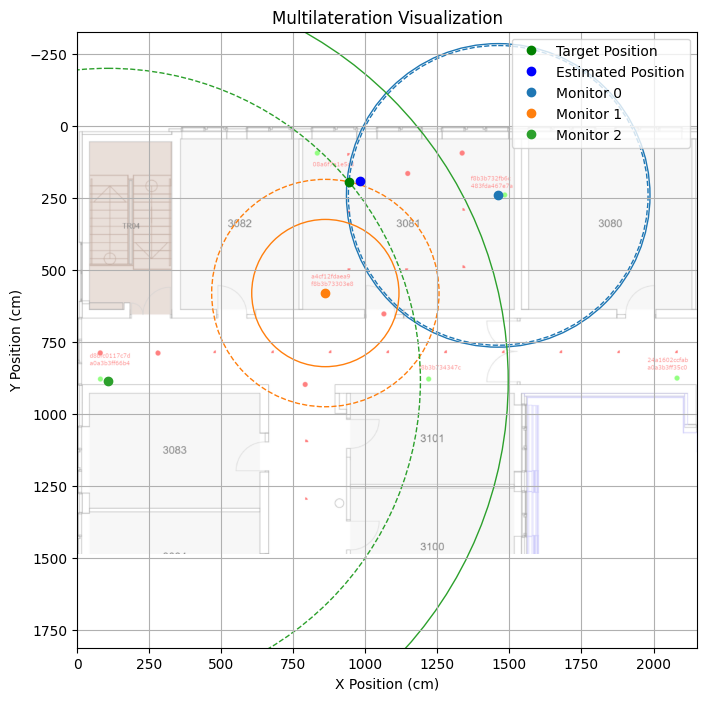

Max error:


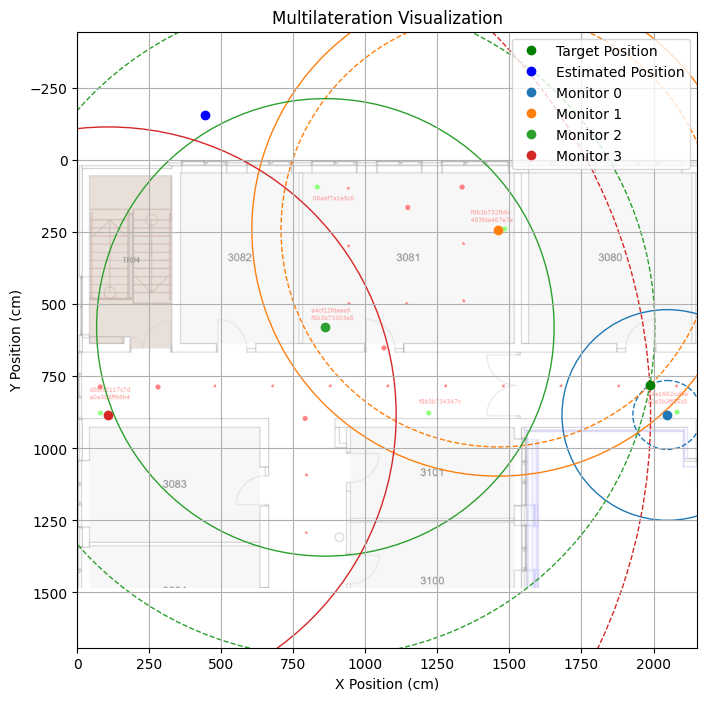

In [32]:
df_estimated_esp8266_row_min_error = df_estimated_esp8266[df_estimated_esp8266["distance_error_tls"] == df_estimated_esp8266["distance_error_tls"].min()]
df_estimated_esp8266_row_max_error = df_estimated_esp8266[df_estimated_esp8266["distance_error_tls"] == df_estimated_esp8266["distance_error_tls"].max()]

df_estimated_esp8266_min = df_eval_ure_esp8266[(df_eval_ure_esp8266["target_mac"] == df_estimated_esp8266_row_min_error["target_mac"].item()) & (df_eval_ure_esp8266["target_position"] == df_estimated_esp8266_row_min_error["target_position"].item())]
df_estimated_esp8266_max = df_eval_ure_esp8266[(df_eval_ure_esp8266["target_mac"] == df_estimated_esp8266_row_max_error["target_mac"].item()) & (df_eval_ure_esp8266["target_position"] == df_estimated_esp8266_row_max_error["target_position"].item())]

print("Min error:")
plot_distances(df_estimated_esp8266_min, df_estimated_esp8266_row_min_error["target_position"].item(), df_estimated_esp8266_row_min_error["estimation_tls"].item())
print("Max error:")
plot_distances(df_estimated_esp8266_max, df_estimated_esp8266_row_max_error["target_position"].item(), df_estimated_esp8266_row_max_error["estimation_tls"].item())

Min error:


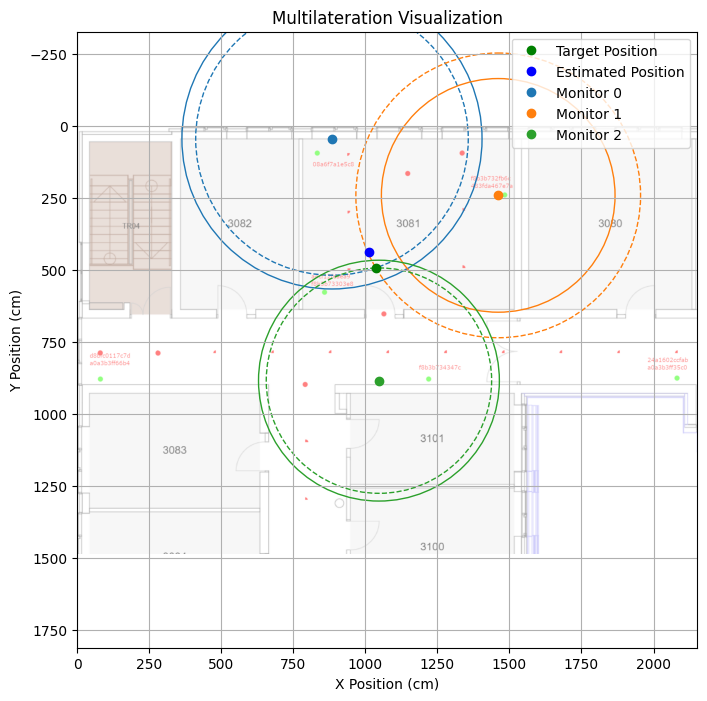

Max error:


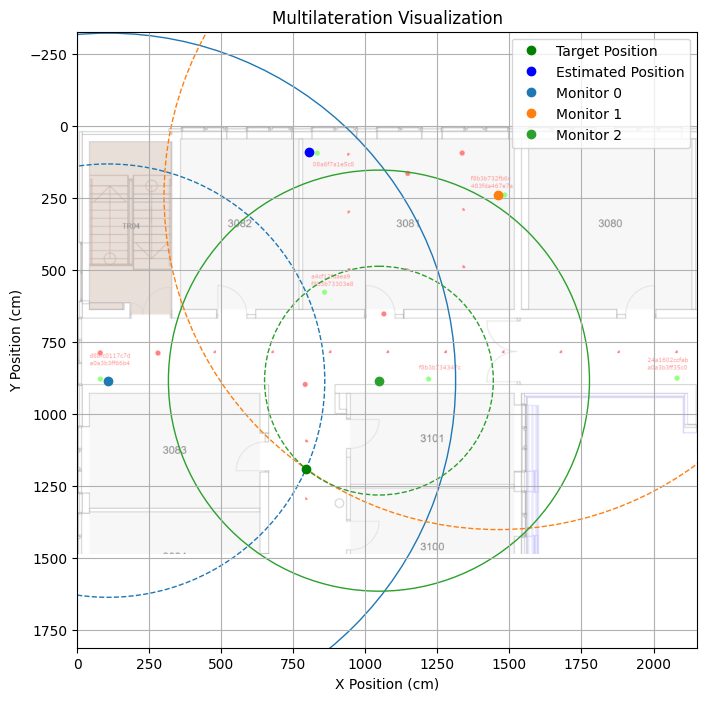

,target_mac,target_position,estimation_tls,distance_error_tls,estimation_twcl_dist_3,distance_error_twcl_dist_3,estimation_twcl_rssi_7,distance_error_twcl_rssi_7,estimation_fpl,distance_error_fpl
36,d81c79de34e1,"(794, 1190)","(803.1465715653516, 90.21168661731895)",1099.826347,"(1110.6389572555674, 596.8779985283392)",672.349565,"(757.9302129107841, 745.6651880602655)",445.796427,"(575.0, 155.0)",1057.915876


In [33]:
df_estimated_esp32_row_min_error = df_estimated_esp32[df_estimated_esp32["distance_error_tls"] == df_estimated_esp32["distance_error_tls"].min()]
df_estimated_esp32_row_max_error = df_estimated_esp32[df_estimated_esp32["distance_error_tls"] == df_estimated_esp32["distance_error_tls"].max()]

df_estimated_esp32_min = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_min_error["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_min_error["target_position"].item())]
df_estimated_esp32_max = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_max_error["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_max_error["target_position"].item())]

print("Min error:")
plot_distances(df_estimated_esp32_min, df_estimated_esp32_row_min_error["target_position"].item(), df_estimated_esp32_row_min_error["estimation_tls"].item())
print("Max error:")
plot_distances(df_estimated_esp32_max, df_estimated_esp32_row_max_error["target_position"].item(), df_estimated_esp32_row_max_error["estimation_tls"].item())
df_estimated_esp32_row_max_error

In [79]:
df_eval_ure_esp32[(df_eval_ure_esp32["target_position"] == (1334, 180)) & (df_eval_ure_esp32["target_mac"] == '20f094118214') & (df_eval_ure_esp32["monitor_mac"] == 'a0a3b3ff66b4')]

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,class,distance,rssi_0,n,estimated_distance,ure


In [80]:
df_eval_ure_esp32[df_eval_ure_esp32["index"] == 116]

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,class,distance,rssi_0,n,estimated_distance,ure
116,116,"(1336, 185)",20f094118214,a0a3b3ff66b4,"(107, 884)",-88.0,inside,14.138748,-48.65549,2.409955,42.912381,28.773633


In [81]:
new_rssi = -88
rssi_0_value = df_eval_ure_esp32[df_eval_ure_esp32["index"] == 116]["rssi_0"].item()
n_value = df_eval_ure_esp32[df_eval_ure_esp32["index"] == 116]["n"].item()
new_distance_value = inverse_path_loss_model(new_rssi, rssi_0_value, n_value)
tmp = df_eval_ure_esp32.assign(rssi=df_eval_ure_esp32["rssi"].where(df_eval_ure_esp32.index != 116, new_rssi))
tmp = tmp.assign(estimated_distance=tmp["estimated_distance"].where(tmp.index != 116, new_distance_value))
tmp[tmp["index"] == 116]

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,class,distance,rssi_0,n,estimated_distance,ure
116,116,"(1336, 185)",20f094118214,a0a3b3ff66b4,"(107, 884)",-88.0,inside,14.138748,-48.65549,2.409955,42.912381,28.773633


GROUP:
     target_mac target_position   monitor_mac anchor_position  rssi  \
0  20f094118214      (177, 786)  08a6f7a1e5c8       (884, 45) -55.0   
3  20f094118214      (177, 786)  a0a3b3ff35c0     (2048, 884) -78.0   
4  20f094118214      (177, 786)  a0a3b3ff66b4      (107, 884) -54.0   
7  20f094118214      (177, 786)  f8b3b732fb6c     (1461, 241) -75.5   
8  20f094118214      (177, 786)  f8b3b734347c     (1047, 884) -64.0   

      rssi_0         n  median_rssi_0  median_n  
0 -41.765336  3.319392     -49.219531  2.409955  
3 -52.402493  2.359835     -49.219531  2.409955  
4 -48.655490  2.409955     -49.219531  2.409955  
7 -49.219531  2.886947     -49.219531  2.409955  
8 -50.078324  1.888182     -49.219531  2.409955  
(177, 786)
[[1461  241]
 [ 884   45]
 [2048  884]
 [ 107  884]
 [1047  884]]
rssis:
[-75.5, -55.0, -78.0, -54.0, -64.0]
positions:
[[1461  241]
 [ 884   45]
 [2048  884]
 [ 107  884]
 [1047  884]]
distances:
[ 813.43049983  250.44216023 1215.39061791  166.63568671  

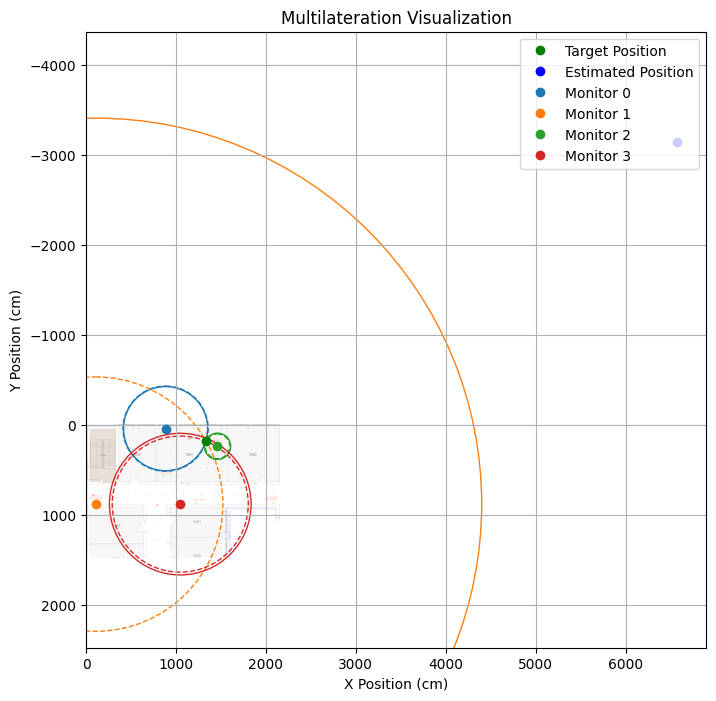

,target_mac,target_position,estimation_tls,distance_error_tls,estimation_tls_median,distance_error_tls_median,estimation_twcl_dist_1_5,distance_error_twcl_dist_1_5,estimation_twcl_rssi_9,distance_error_twcl_rssi_9,estimation_fpl,distance_error_fpl
28,342eb61ec446,"(1036, 493)","(1100.1842845898473, 488.73674582878147)",64.325716,"(743.779007674376, 551.2752722266256)",297.975025,"(1142.7651966891808, 465.1243618680532)",110.344272,"(1058.7160413678769, 511.2470194031321)",29.137128,"(1175.0, 695.0)",245.203997
45,d81c79de34e1,"(939, 395)","(1020.3388237335257, 406.61387468666055)",82.163777,"(885.3741743004081, 409.6773861825047)",55.598155,"(1087.5865176795742, 324.03071557673104)",164.665092,"(987.5150031088821, 231.06156928755036)",170.966414,"(1015.0, 560.0)",181.661774
38,d81c79de34e1,"(177, 786)","(73.37994872750275, 822.9088418602403)",109.997171,"(213.27898746320028, 1869.9029476987484)",1084.509919,"(290.1131457235875, 832.3628289370986)",122.246046,"(217.75357033835652, 860.8314501136493)",85.209151,"(185.0, 770.0)",17.888544
31,342eb61ec446,"(1240, 492)","(1109.4237312246023, 453.01897280098217)",136.270622,"(1011.1962334701415, 441.0382271642365)",234.410465,"(1187.2804558071894, 399.36106876250676)",106.589502,"(1056.3227455608148, 349.1705691762609)",232.674838,"(1020.0, 165.0)",394.118003
25,342eb61ec446,"(939, 395)","(803.8156561478288, 431.4540720433902)",140.013236,"(-2743.4735876298787, 1109.5720749351192)",3751.163149,"(1048.474222903375, 345.7899429598574)",120.025977,"(972.7668128529717, 333.328193518735)",70.310805,"(700.0, 315.0)",252.033728
11,20f094118214,"(1186, 783)","(1042.245842726819, 822.5494299092634)",149.095322,"(915.0477446389249, 1029.151004580747)",366.067537,"(1037.2106014108037, 788.1616122665037)",148.878902,"(998.0372585045857, 810.6470572352182)",189.985136,"(1125.0, 930.0)",159.154013
48,d81c79de34e1,"(1049, 645)","(1058.0620484220492, 492.0530052510098)",153.215221,"(980.4980295486682, 481.7014830546147)",177.084515,"(1098.0737237145179, 595.7034651011566)",69.558455,"(1050.1399647061558, 606.4421575386112)",38.574690,"(1050.0, 635.0)",10.049876
46,d81c79de34e1,"(974, 786)","(1046.6735526105665, 645.4977471891597)",158.184476,"(967.7910713183254, 747.0258178055325)",39.465652,"(1070.0366569399616, 763.6734472256848)",98.597741,"(1045.6019571781826, 821.731052786464)",80.022174,"(960.0, 825.0)",41.436699
8,20f094118214,"(974, 779)","(928.4415604241686, 936.2539780990128)",163.720448,"(757.1192594835454, 1194.6960360764792)",468.871464,"(1012.4291819371732, 837.8393875539834)",70.277134,"(998.7246692001069, 851.903827585165)",76.982318,"(915.0, 840.0)",84.864598
50,d81c79de34e1,"(1240, 492)","(1376.7369956119956, 588.553486162665)",167.390506,"(1453.3331352017694, 665.012580270036)",274.671403,"(1247.6325103766017, 427.7464673797008)",64.705268,"(1230.2267032580216, 468.7359349571079)",25.233590,"(1335.0, 110.0)",393.635618


In [82]:
tmp_estimatd_esp32 = estimate_positions(tmp).sort_values("distance_error_tls")
tmp_estimated_position = tmp_estimatd_esp32[(tmp_estimatd_esp32["target_mac"] == df_estimated_esp32_row_max_error["target_mac"].item()) & (tmp_estimatd_esp32["target_position"] == df_estimated_esp32_row_max_error["target_position"].item())]["estimation_tls"].item()

tmp_esp32_max = tmp[(tmp["target_mac"] == df_estimated_esp32_row_max_error["target_mac"].item()) & (tmp["target_position"] == df_estimated_esp32_row_max_error["target_position"].item())]

print("Max error:")
plot_distances(tmp_esp32_max, df_estimated_esp32_row_max_error["target_position"].item(), tmp_estimated_position)
tmp_estimatd_esp32

- numerical instability because of very large values in the matrices
- outlier appears very far away
- only values from 3 (instead of 4) monitors → no redundancy → error has large impact

### Error visualization for twcl:

Min error:


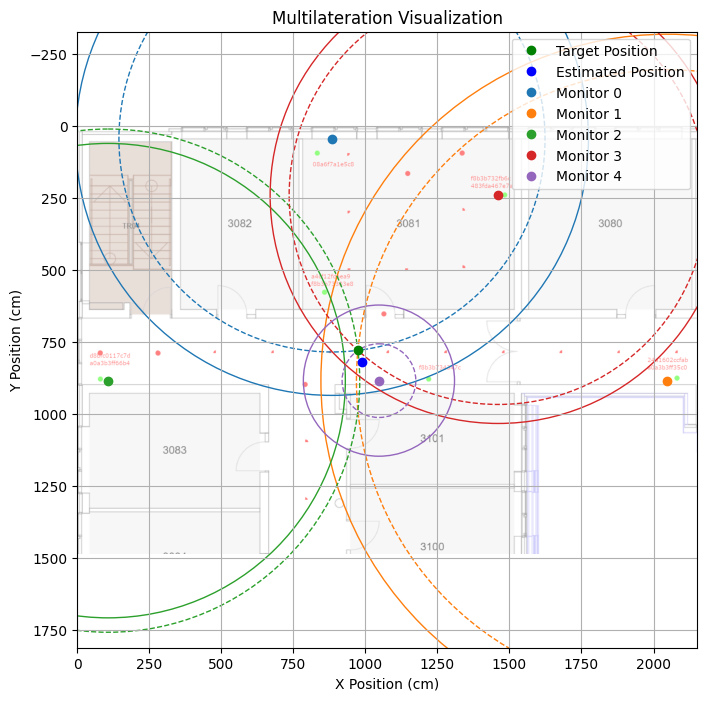

Max error:


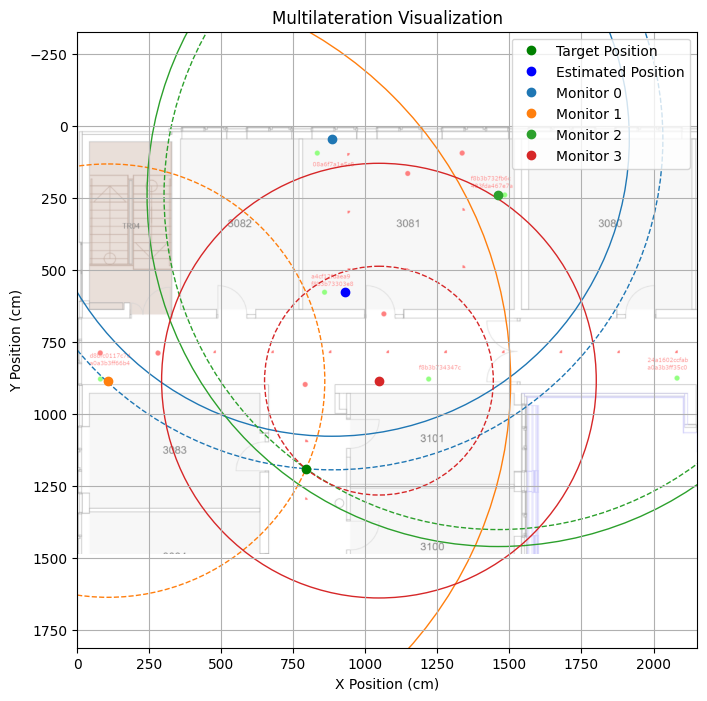

,target_mac,target_position,estimation_tls,distance_error_tls,estimation_twcl_dist_3,distance_error_twcl_dist_3,estimation_twcl_rssi_7,distance_error_twcl_rssi_7,estimation_fpl,distance_error_fpl
24,342eb61ec446,"(794, 1190)","(1473.7457096288992, 1249.154109610307)",682.314765,"(996.6951582168313, 641.6025255855568)",584.65812,"(927.6011791297193, 576.2173110690264)",628.154809,"(1695.0, 325.0)",1249.010008


In [35]:
df_estimated_esp32_row_min_error_twcl = df_estimated_esp32[df_estimated_esp32["distance_error_twcl_rssi_7"] == df_estimated_esp32["distance_error_twcl_rssi_7"].min()]
df_estimated_esp32_row_max_error_twcl = df_estimated_esp32[df_estimated_esp32["distance_error_twcl_rssi_7"] == df_estimated_esp32["distance_error_twcl_rssi_7"].max()]

df_estimated_esp32_min_twcl = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_min_error_twcl["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_min_error_twcl["target_position"].item())]
df_estimated_esp32_max_twcl = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_max_error_twcl["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_max_error_twcl["target_position"].item())]

print("Min error:")
plot_distances(df_estimated_esp32_min_twcl, df_estimated_esp32_row_min_error_twcl["target_position"].item(), df_estimated_esp32_row_min_error_twcl["estimation_twcl_rssi_7"].item())
print("Max error:")
plot_distances(df_estimated_esp32_max_twcl, df_estimated_esp32_row_max_error_twcl["target_position"].item(), df_estimated_esp32_row_max_error_twcl["estimation_twcl_rssi_7"].item())
df_estimated_esp32_row_max_error_twcl

In [84]:
df_fingerprint_median

,index,target_position,target_mac,monitor_mac,anchor_position,rssi
0,0,"(79, 789)",20f094118214,08a6f7a1e5c8,"(884, 45)",-80.0
1,1,"(79, 789)",20f094118214,24a1602ccfab,"(2048, 884)",-35.5
2,2,"(79, 789)",20f094118214,483fda467e7a,"(1461, 241)",-82.0
3,3,"(79, 789)",20f094118214,a0a3b3ff35c0,"(2048, 884)",-58.0
4,4,"(79, 789)",20f094118214,a0a3b3ff66b4,"(107, 884)",-58.5
...,...,...,...,...,...,...
610,199,"(2080, 783)",d81c79de34e1,a0a3b3ff66b4,"(107, 884)",-72.0
611,200,"(2080, 783)",d81c79de34e1,a4cf12fdaea9,"(861, 580)",-84.0
612,201,"(2080, 783)",d81c79de34e1,d8bfc0117c7d,"(107, 884)",-69.0
613,202,"(2080, 783)",d81c79de34e1,f8b3b732fb6c,"(1461, 241)",-87.0


In [38]:
from matplotlib.ticker import AutoMinorLocator

def plot_localization_error(df, group_name):
    # Calculate the mean error per target device for each algorithm
    agg_df = df.groupby('target_mac')[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].apply(rmse).reset_index()

    # Define algorithms and their corresponding distance error columns
    algorithms = ['tls', 'twcl_dist_3', 'twcl_rssi_7', 'fpl']
    distance_error_cols = [f'distance_error_{algo}' for algo in algorithms]

    # Custom mappings for friendly names
    friendly_names_algo = {
        'tls': 'LST',
        'twcl_dist_3': 'WCL (Distance)',
        'twcl_rssi_7': 'WCL (RSSI)',
        'fpl': 'FP',
    }

    # Apply friendly names for the x-axis labels
    agg_df['friendly_name'] = agg_df['target_mac'].map(device_names)

    # Plot setup
    group_spacing = 0.5  # Space between groups
    bar_spacing = 0.05   # Space between bars within a group
    width = 0.15         # Narrower bar width
    x = np.arange(len(agg_df)) * (len(algorithms) * (width + bar_spacing) + group_spacing)

    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot each algorithm's bars
    for i, algo in enumerate(algorithms):
        bar_positions = x + i * (width + bar_spacing)
        ax.bar(
            bar_positions,
            agg_df[f'distance_error_{algo}'] / 100.0,
            width,
            label=friendly_names_algo[algo]
        )

    # Add labels, title, and legend
    ax.set_xlabel('Target Devices', fontsize=12)
    ax.set_ylabel('RMSE User Accuracy (m)', fontsize=12)
    ax.set_title(f'RMSE User Accuracy using {group_name}', fontsize=14)
    ax.set_xticks(x + (len(algorithms) - 1) * (width + bar_spacing) / 2)
    ax.set_xticklabels(agg_df['friendly_name'])
    ax.legend(title='Algorithm')

    # Move the legend to the right
    # ax.legend(title='Algorithm', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Enable grid
    ax.grid(True, which='major', axis='y', linestyle=':', linewidth=1.5, alpha=0.8)  # Thicker, solid lines for major ticks
    ax.yaxis.set_minor_locator(AutoMinorLocator(2))
    ax.grid(True, which='minor', axis='y', linestyle=':', linewidth=1.0, alpha=0.8)
    ax.set_axisbelow(True)  # Place grid lines below the bars

    # ax.set_ylim(0, 5)
    # ax.set_yscale('log')

    # Display the plot
    plt.tight_layout()
    plt.show()

All:


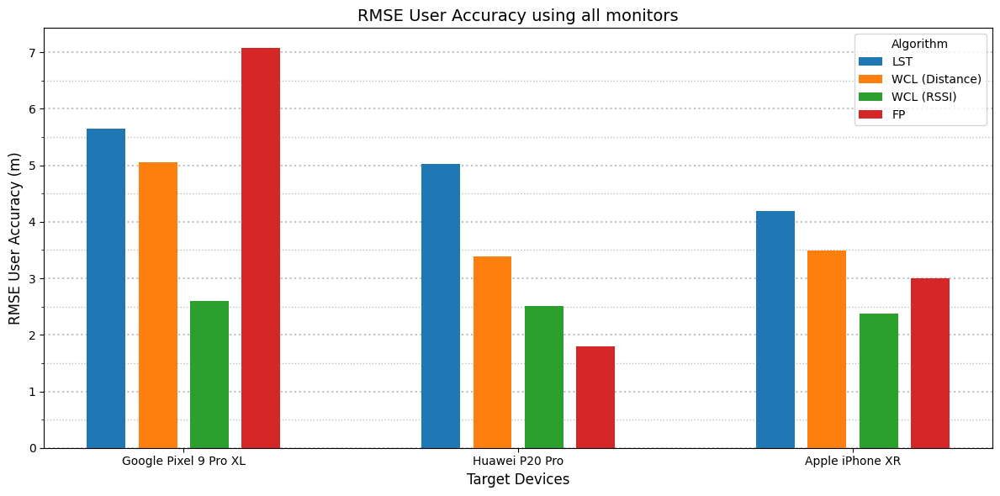

ESP8266:


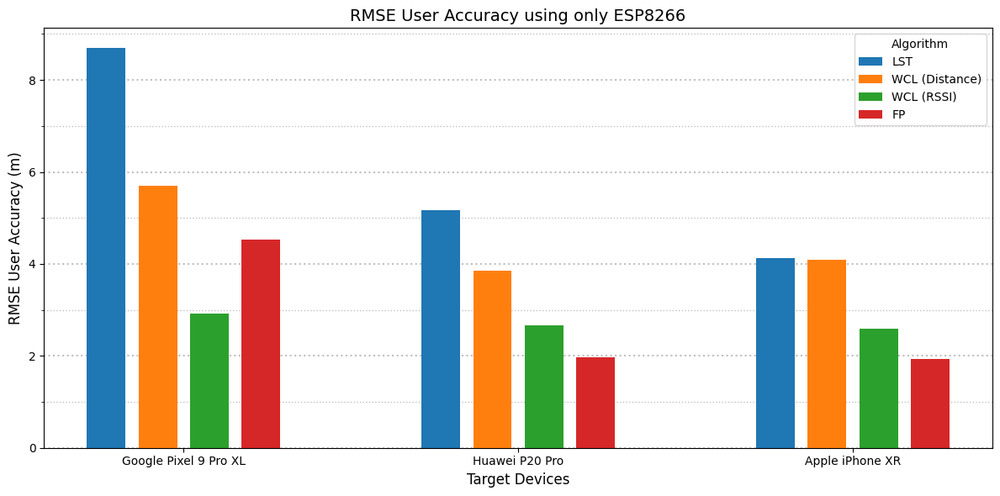

ESP32:


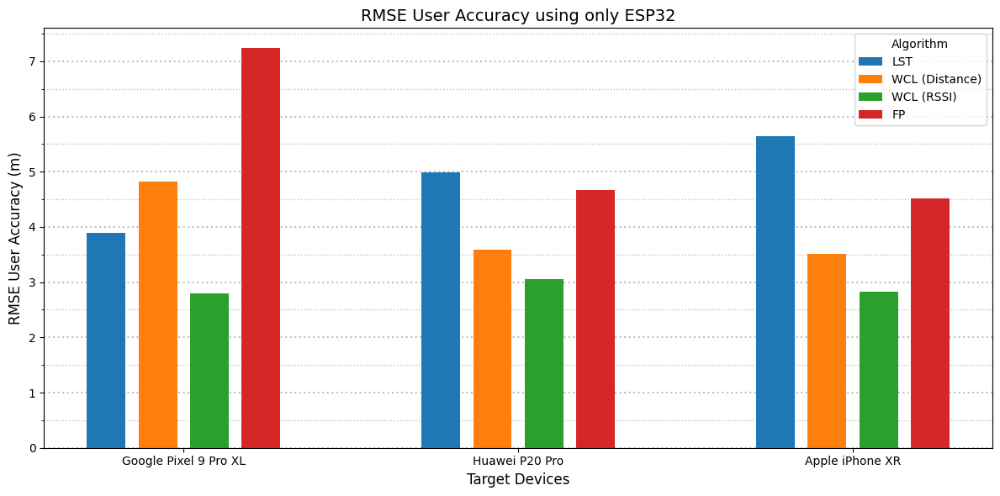

In [39]:
print("All:")
plot_localization_error(df_estimated_all, 'all monitors')
print("ESP8266:")
plot_localization_error(df_estimated_esp8266, 'only ESP8266')
print("ESP32:")
plot_localization_error(df_estimated_esp32, 'only ESP32')

In [40]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import get_cmap

def plot_localizations(df1, df2, df3, background_image_path):
    """
    Plots the target position and estimated positions from multiple algorithms for multiple target devices
    across three hardware configurations.
    
    Parameters:
        df1, df2, df3 (pandas.DataFrame): DataFrames containing localization data for different hardware configurations.
        background_image_filepath (str): Filepath to the background image for plotting.
    """
    # Load the background image
    if background_image_path:
        img = plt.imread(background_image_path)
        # ax.imshow(img, aspect='auto', alpha=0.5)
    
    # List of algorithms to plot
    algorithms = ['estimation_tls', 'estimation_tls_median', 
                  'estimation_twcl_dist_1_5', 'estimation_twcl_rssi_9', 'estimation_fpl']
    
    # Combine all dataframes into a list for easier processing
    dfs = [df1, df2, df3]
    
    # Get unique target positions
    target_positions = df1['target_position'].unique()
    
    # Set up the figure dimensions
    num_positions = len(target_positions)
    
    for i, target_position in enumerate(target_positions):
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        for j, df in enumerate(dfs):
            ax = axes[j]
            
            # Filter data for the current target position
            df_filtered = df[df['target_position'] == target_position]
            
            # Plot the background image
            ax.imshow(img, aspect='auto', alpha=0.5)
            
            # Plot the target position as a red marker
            for _, row in df_filtered.iterrows():
                target_mac = row['target_mac']
                x, y = row['target_position']
                ax.scatter(x, y, color='red', label=f'Target ({target_mac})', zorder=2)
                
                # Plot the estimated positions for each algorithm
                for algo in algorithms:
                    if algo in row and row[algo] is not None:
                        est_x, est_y = row[algo]
                        ax.scatter(est_x, est_y, label=f'{algo} ({target_mac})', zorder=3)
            
            # Set axis labels and title
            ax.set_title(f'Hardware Config {j + 1} - Target Position {target_position}', fontsize=14)
            ax.set_xlabel('X Coordinate')
            ax.set_ylabel('Y Coordinate')
            ax.legend(loc='upper right', fontsize=8)
            ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    
        # Adjust layout for better spacing
        plt.tight_layout()
        plt.show()

In [41]:
#df_estimated_esp8266['hardware'] = 'esp8266'
#df_estimated_esp32['hardware'] = 'esp32'
#df_estimated_all['hardware'] = 'all'

#df_estimated_combined = pd.concat([df_estimated_esp8266, df_estimated_esp32, df_estimated_all])
#preprocess_target_positions(df_estimated_combined)['target_position'].unique()
df_estimated_esp8266['target_position'].unique()

array([(943, 194), (939, 194), (939, 395), (1049, 645), (1186, 783),
       (974, 786), (1036, 493), (974, 779), (1240, 492), (777, 786),
       (1381, 781), (793, 983), (777, 783), (1334, 185), (1336, 383),
       (794, 983), (1336, 185), (794, 1190), (576, 786), (576, 783),
       (1581, 783), (777, 779), (1581, 786), (380, 783), (380, 784),
       (177, 786), (1777, 779), (380, 779), (1987, 781), (1381, 783)],
      dtype=object)

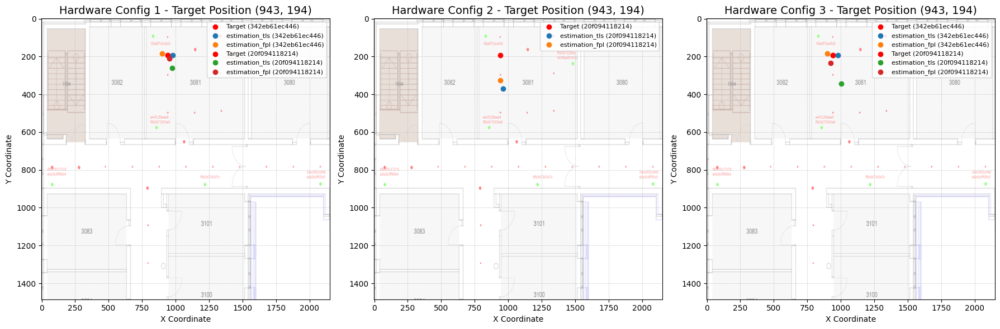

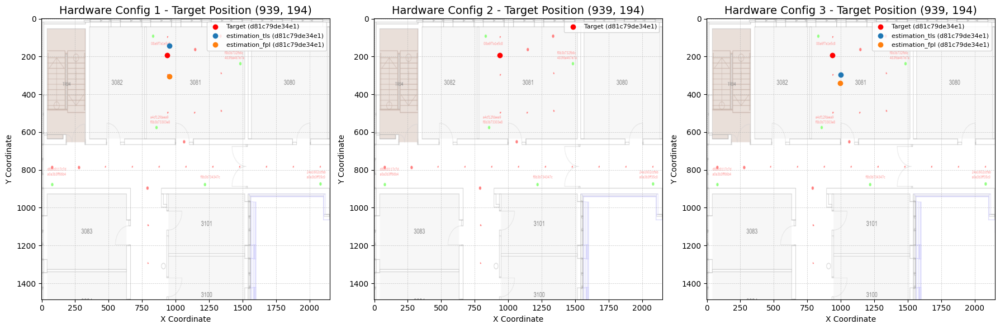

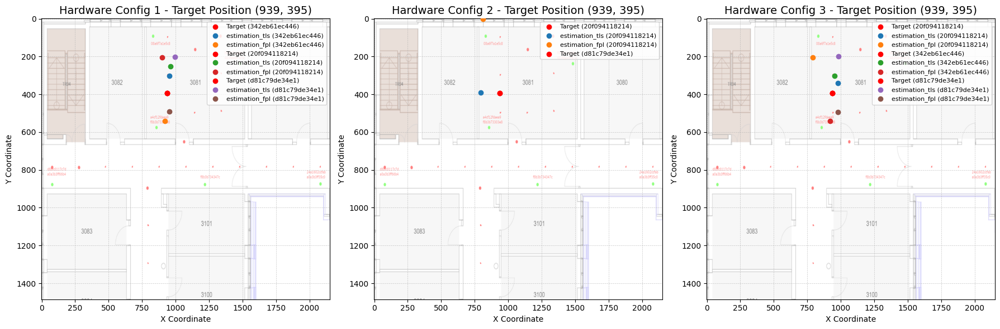

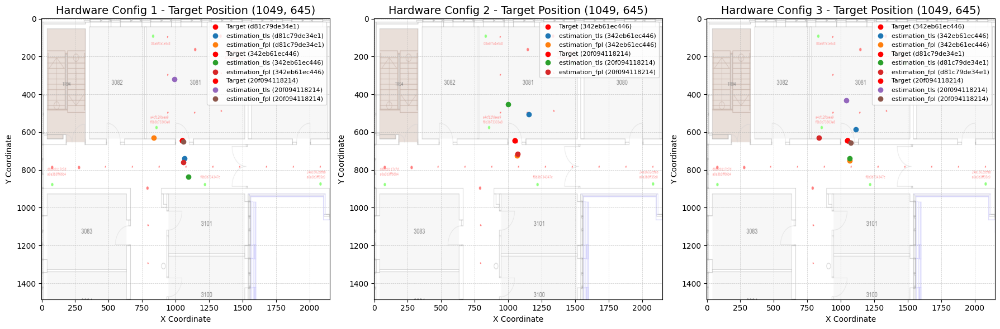

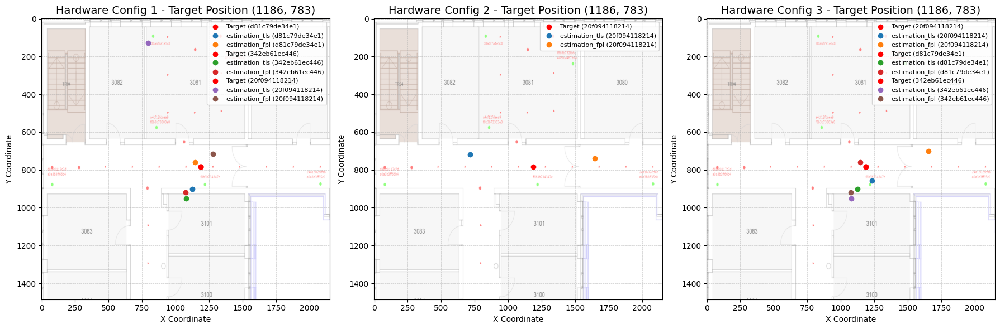

C:\Users\nikok\AppData\Local\Temp\ipykernel_320404\1639857411.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', fontsize=8)


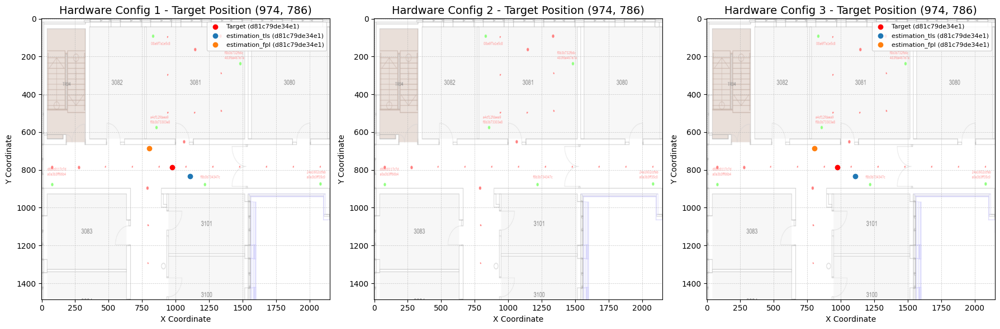

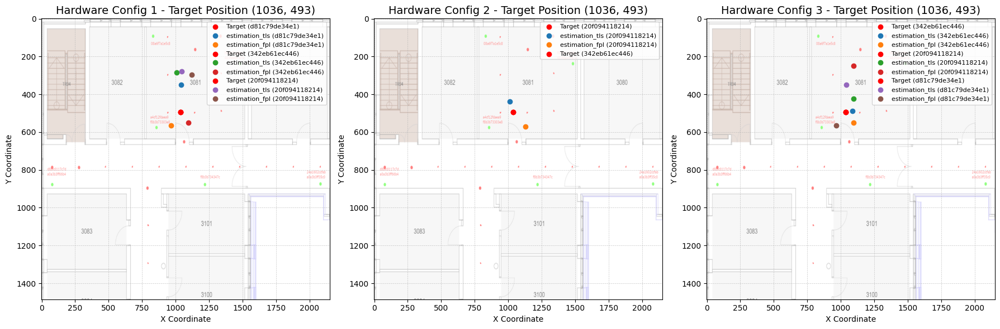

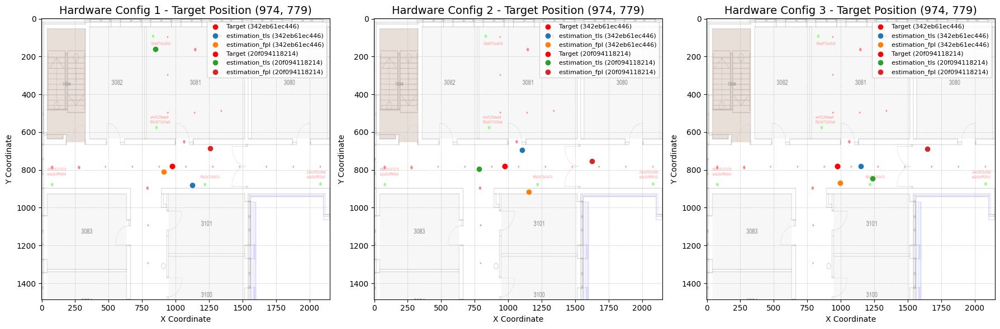

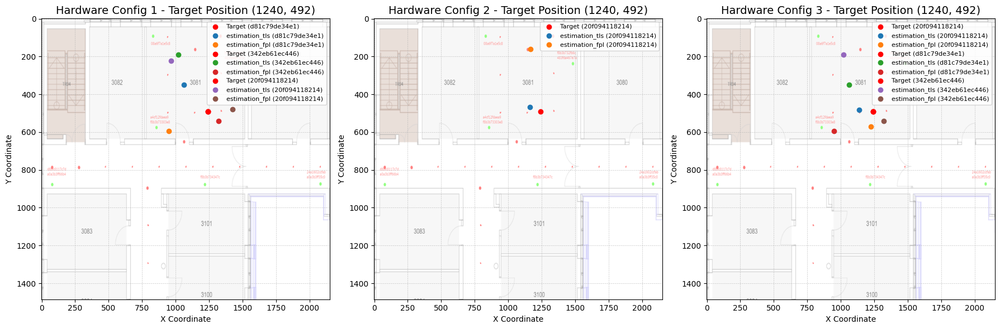

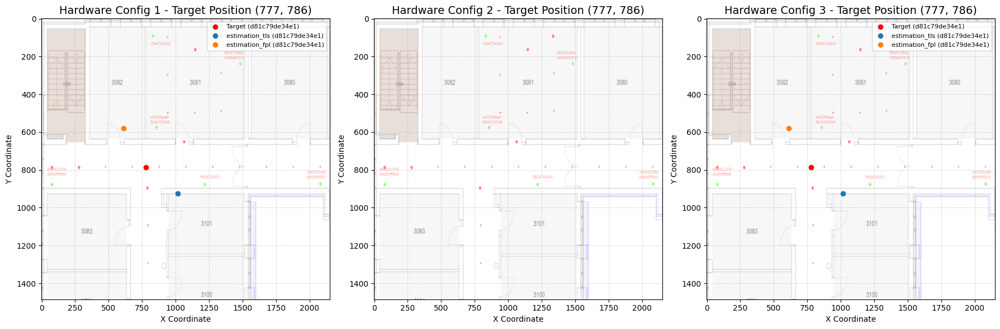

...

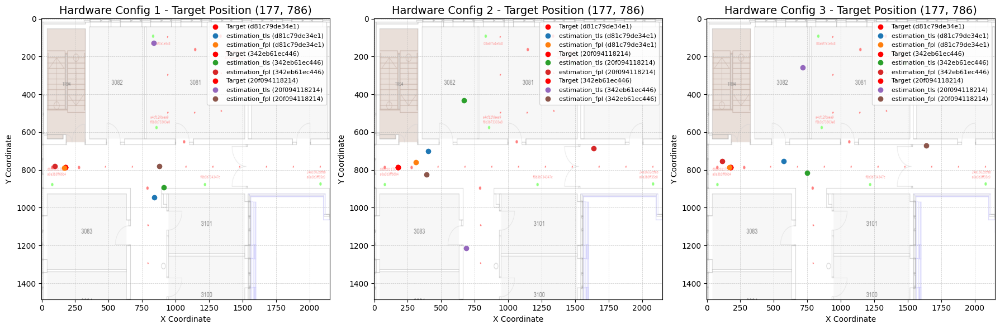

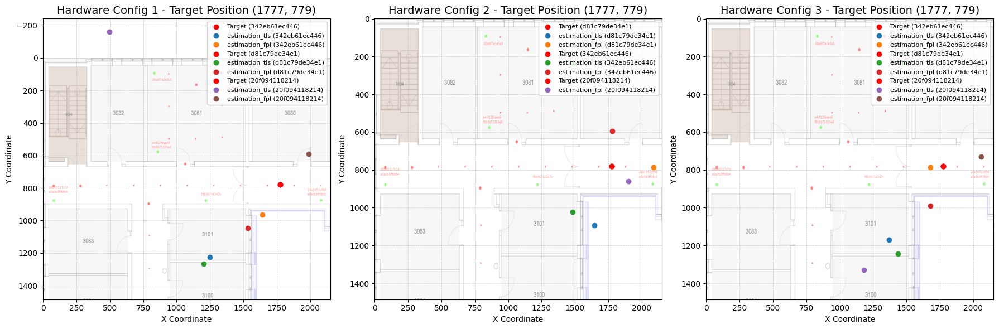

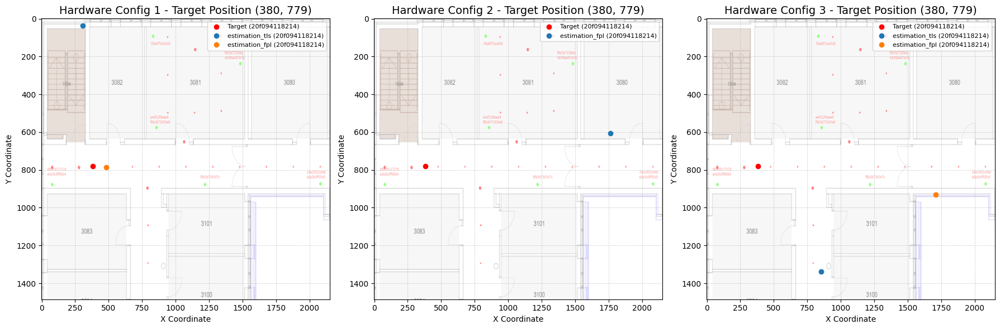

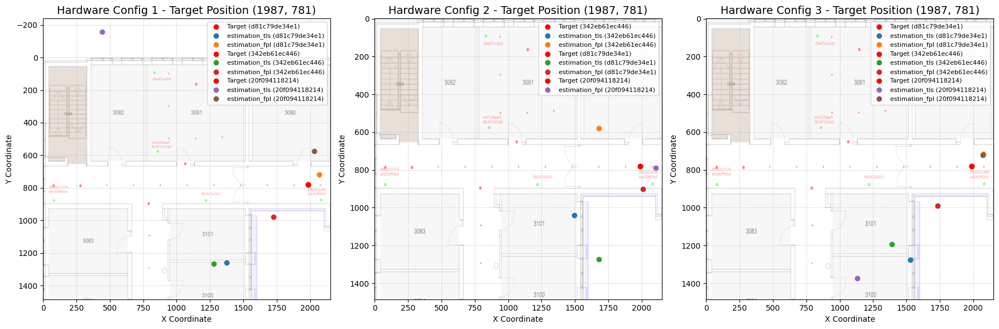

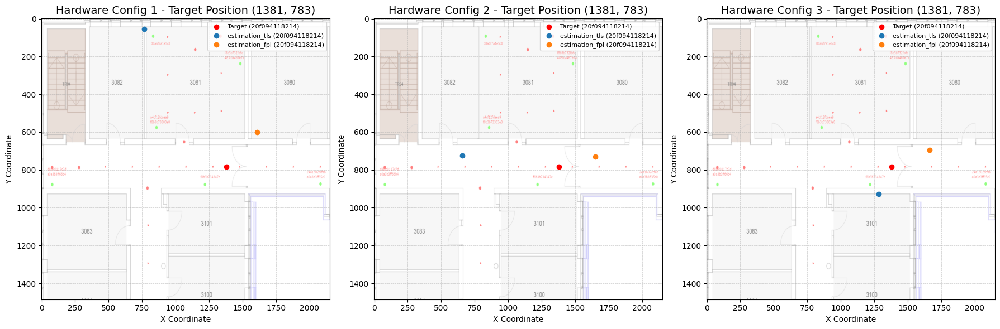

In [42]:
plot_localizations(df_estimated_esp8266, df_estimated_esp32, df_estimated_all, './images/apb_3081_scaled_fingerprints.png')